In [3]:
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df_yclean = pd.read_csv("./data/Flotation_Plant_preprocessed.csv")

## check hourly column or sec column

In [29]:
df_yclean.columns

Index(['date', '% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level',
       '% Iron Concentrate', '% Silica Concentrate', 'datetime'],
      dtype='object')

In [48]:
df_temp = df_yclean[df_yclean['date']<'2017-03-12 00:00:00']

C:\Users\Ling\AppData\Local\Temp\ipykernel_8924\127881822.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(i)


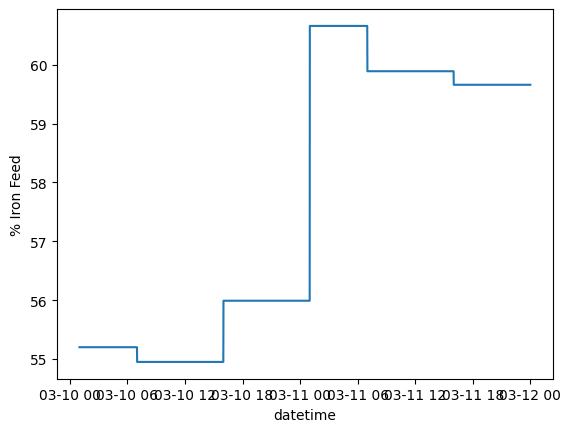

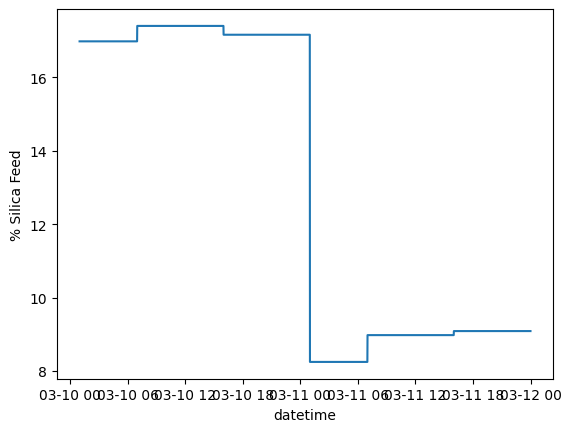

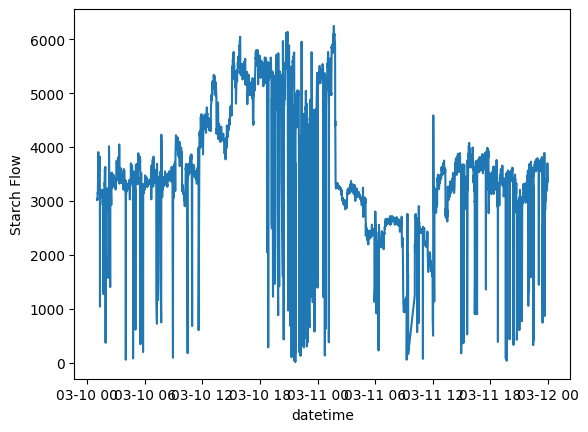

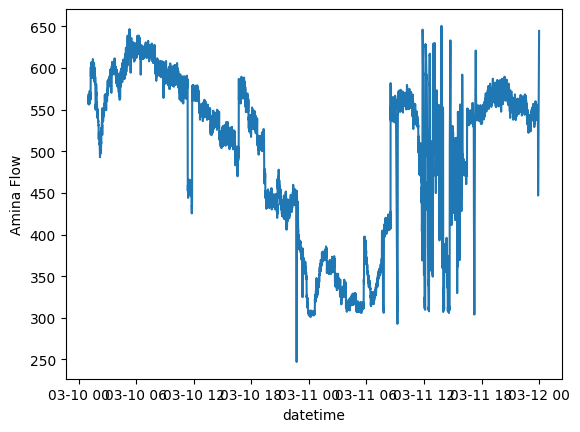

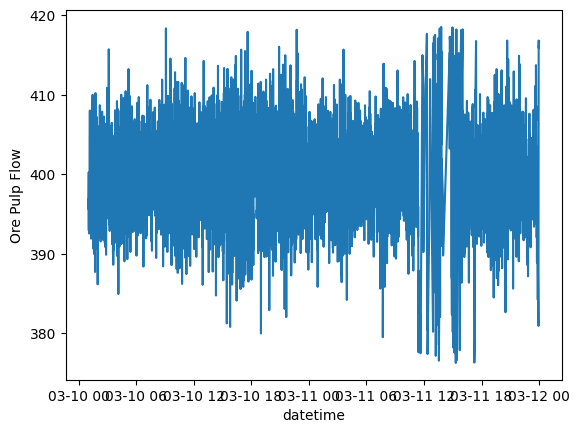

...

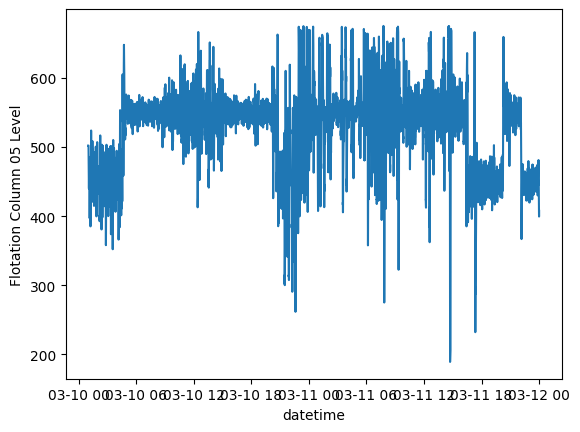

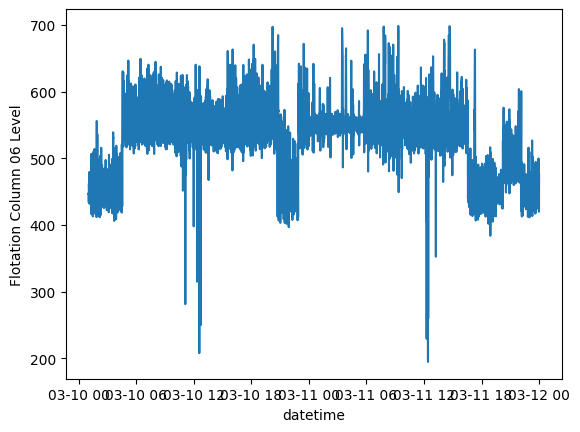

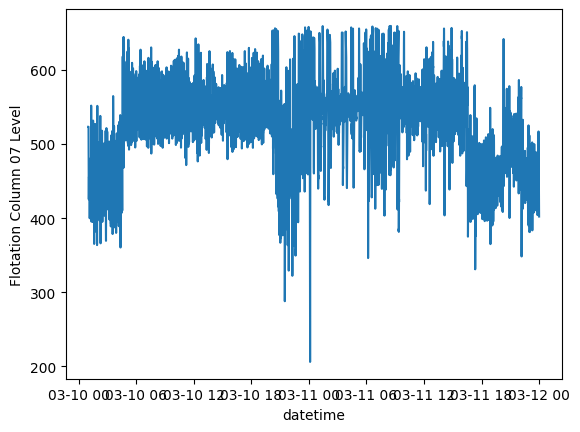

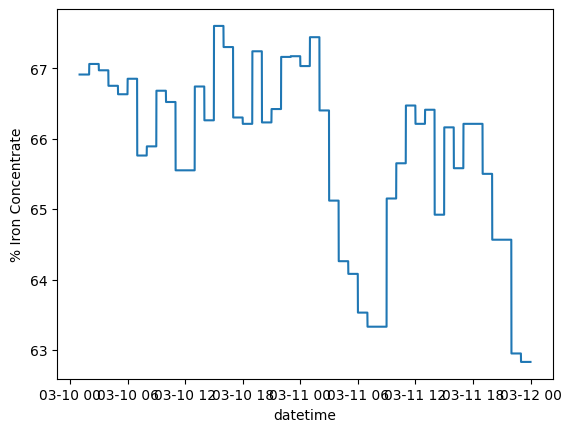

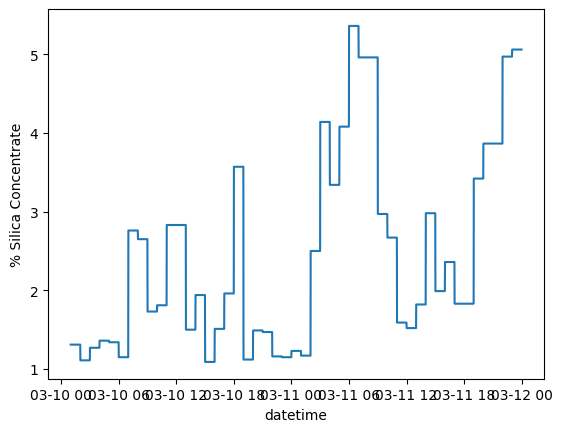

In [49]:
import matplotlib.pyplot as plt
for i, col in enumerate(df_temp.columns):
    if col not in ['date', 'datetime']:
        plt.figure(i)
        sns.lineplot(data=df_temp, x="datetime", y=col)

In [51]:
df_yclean.columns

Index(['date', '% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level',
       '% Iron Concentrate', '% Silica Concentrate', 'datetime'],
      dtype='object')

In [52]:
df_yclean['Flotation Column 04 Air Flow'].value_counts()

295.096000    82836
299.927000    14830
300.366000    10206
300.806000     6445
299.487000     5494
              ...  
295.326636        1
295.323102        1
295.319567        1
295.316033        1
304.021000        1
Name: Flotation Column 04 Air Flow, Length: 196006, dtype: int64

In [53]:
df_yclean['Flotation Column 05 Air Flow'].value_counts()

306.400000    82839
299.927000     5117
299.487000     2935
300.366000     2552
297.949000     1986
              ...  
297.816964        1
297.813755        1
297.810545        1
297.807335        1
294.579000        1
Name: Flotation Column 05 Air Flow, Length: 194711, dtype: int64

結論  
1. 多欄位同值但為每20秒測量一次者: Flotation Column 05 Air Flow, Flotation Column 04 Air Flow
2. 每小時測量之欄位：% Iron Concentrate', '% Silica Concentrate, '% Iron Feed', '% Silica Feed'
3. 每20秒測量之欄位： 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level'

## 共線性
1. 空氣柱1, 2, 3可以擇一放入模型，若是一起放入時須注意
2. % Iron Feed, % Silica Feed也有高共線性，應捨棄一個
3. % Iron Concentrate本來就不該放入進行預測(應用上不合)

In [35]:
df_corr = df_yclean.corr()

C:\Users\Ling\AppData\Local\Temp\ipykernel_388\417400354.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_corr = df_yclean.corr()


In [56]:
corr_cols = []
for col in df_corr.columns:
    temp = set(df_corr[(df_corr[col]>=0.8) | (df_corr[col]<=-0.8)].index.array)
    if len(temp - {col})!=0:
        if sorted(list(temp)) not in corr_cols:
            corr_cols.append(sorted(list(temp)))

In [57]:
corr_cols

[['% Iron Feed', '% Silica Feed'],
 ['Flotation Column 01 Air Flow',
  'Flotation Column 02 Air Flow',
  'Flotation Column 03 Air Flow'],
 ['Flotation Column 06 Air Flow', 'Flotation Column 07 Air Flow'],
 ['% Iron Concentrate', '% Silica Concentrate']]

-0.9718334262339337


<AxesSubplot: xlabel='% Iron Feed', ylabel='% Silica Feed'>

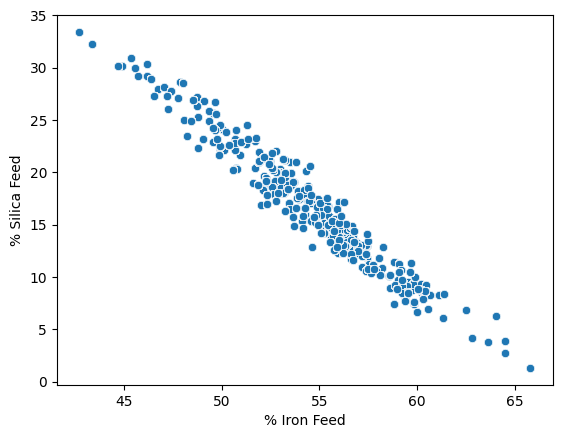

In [62]:
print(df_corr.loc['% Iron Feed', '% Silica Feed'])
sns.scatterplot(data=df_yclean, x='% Iron Feed', y='% Silica Feed')

0.8540695100854286


<AxesSubplot: xlabel='Flotation Column 06 Air Flow', ylabel='Flotation Column 07 Air Flow'>

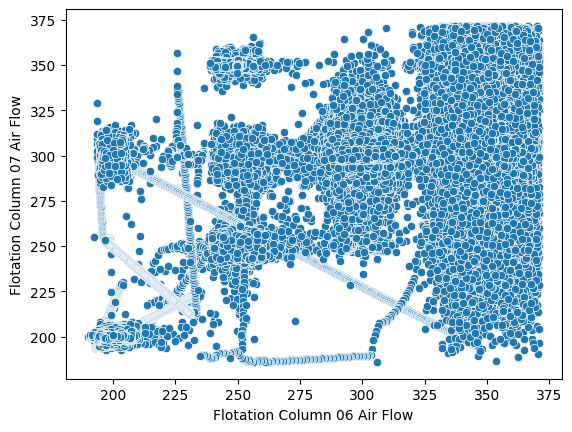

In [63]:
print(df_corr.loc['Flotation Column 06 Air Flow', 'Flotation Column 07 Air Flow'])
sns.scatterplot(data=df_yclean, x='Flotation Column 06 Air Flow', y='Flotation Column 07 Air Flow')

0.84827845733269


<AxesSubplot: xlabel='Flotation Column 01 Air Flow', ylabel='Flotation Column 02 Air Flow'>

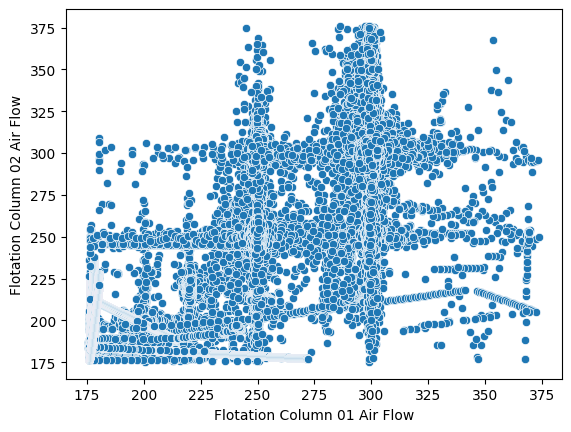

In [64]:
print(df_corr.loc['Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow'])
sns.scatterplot(data=df_yclean, x='Flotation Column 01 Air Flow', y='Flotation Column 02 Air Flow')

0.9545280357014759


<AxesSubplot: xlabel='Flotation Column 01 Air Flow', ylabel='Flotation Column 03 Air Flow'>

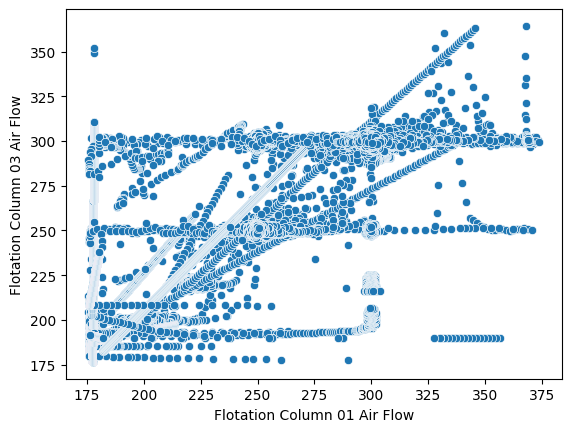

In [65]:
print(df_corr.loc['Flotation Column 01 Air Flow', 'Flotation Column 03 Air Flow'])
sns.scatterplot(data=df_yclean, x='Flotation Column 01 Air Flow', y='Flotation Column 03 Air Flow')

0.8604384985524488


<AxesSubplot: xlabel='Flotation Column 02 Air Flow', ylabel='Flotation Column 03 Air Flow'>

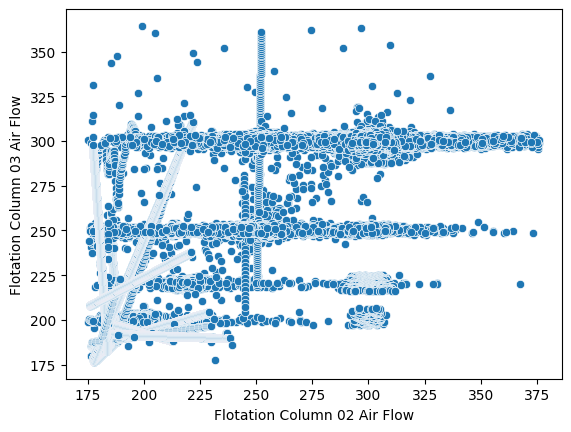

In [66]:
print(df_corr.loc['Flotation Column 02 Air Flow', 'Flotation Column 03 Air Flow'])
sns.scatterplot(data=df_yclean, x='Flotation Column 02 Air Flow', y='Flotation Column 03 Air Flow')

-0.8012194987797312


<AxesSubplot: xlabel='% Iron Concentrate', ylabel='% Silica Concentrate'>

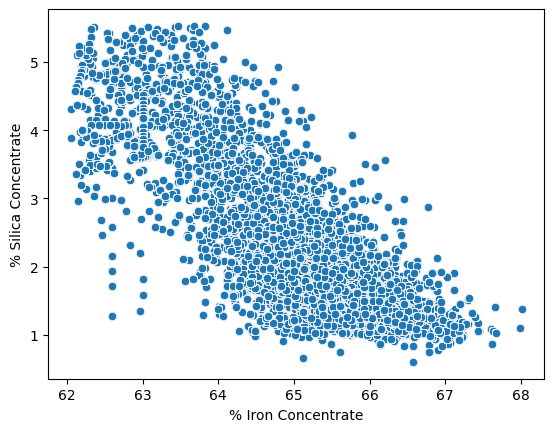

In [67]:
print(df_corr.loc['% Iron Concentrate', '% Silica Concentrate'])
sns.scatterplot(data=df_yclean, x='% Iron Concentrate', y='% Silica Concentrate')

## 每小時測量之欄位EDA

### 與y的關係

-0.07711058281177773


<AxesSubplot: xlabel='% Iron Feed', ylabel='% Silica Concentrate'>

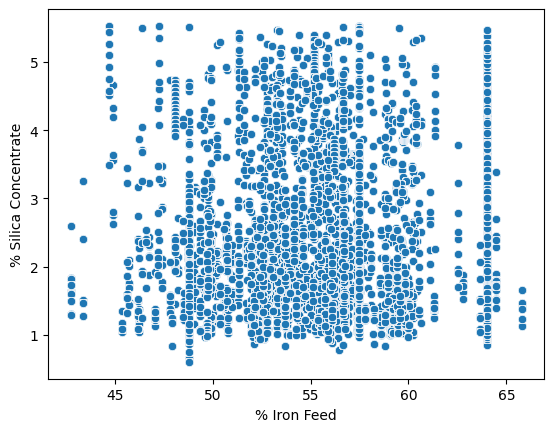

In [73]:
print(df_corr.loc['% Silica Concentrate', '% Iron Feed'])
sns.scatterplot(data=df_yclean, x='% Iron Feed', y='% Silica Concentrate')

0.07277821210176207


<AxesSubplot: xlabel='% Silica Feed', ylabel='% Silica Concentrate'>

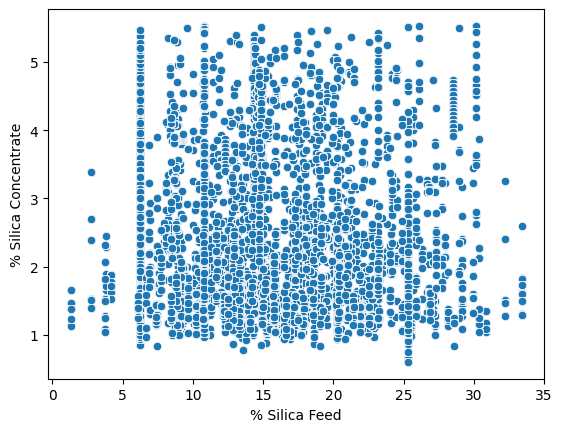

In [74]:
print(df_corr.loc['% Silica Concentrate', '% Silica Feed'])
sns.scatterplot(data=df_yclean, x='% Silica Feed', y='% Silica Concentrate')

### 與時間的關係
日期、月份、時間(小時即可)

In [70]:
print(df_yclean['datetime'].max())
print(df_yclean['datetime'].min())

2017-09-09 23:59:40
2017-03-10 01:00:00


In [30]:
df_yclean['time_month'] = df_yclean['datetime'].dt.month
df_yclean['time_day'] = df_yclean['datetime'].dt.day
df_yclean['time_hour'] = df_yclean['datetime'].dt.hour
df_yclean['time_min'] = df_yclean['datetime'].dt.minute
df_yclean['time_sec'] = df_yclean['datetime'].dt.second

In [31]:
df_yclean['time_time'] = df_yclean['datetime'].dt.time.astype('str')

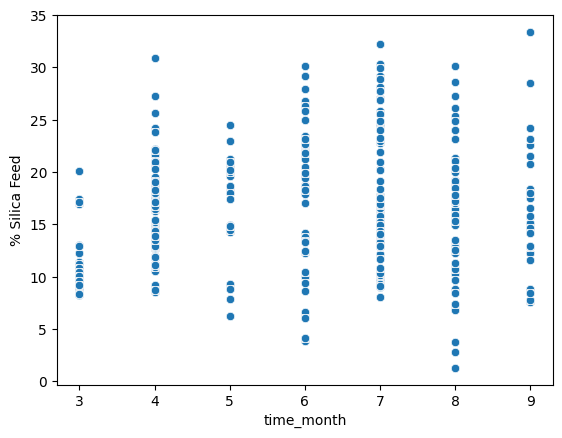

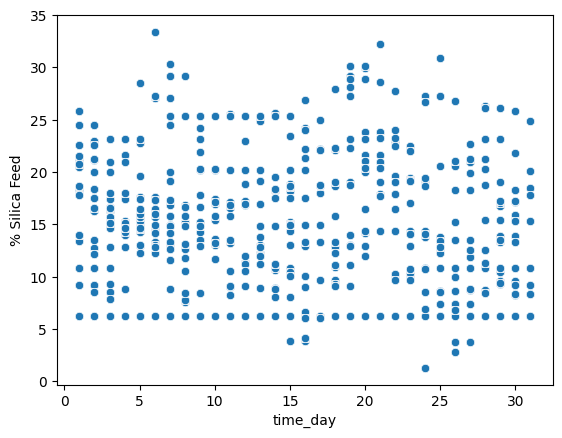

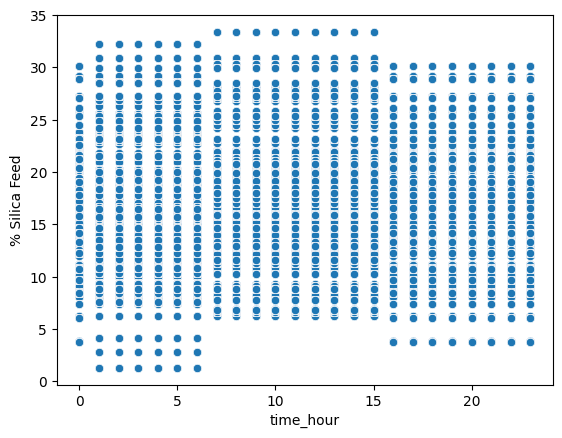

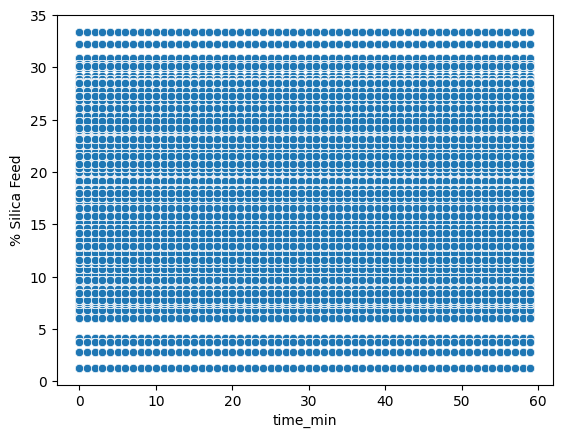

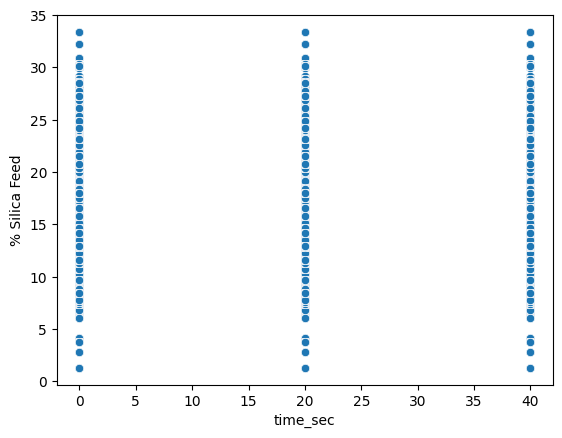

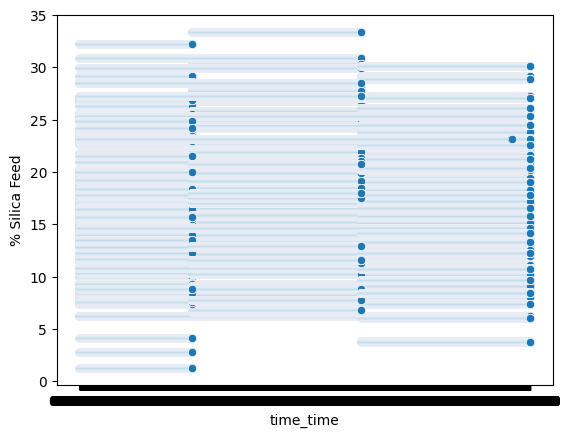

In [90]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec', 'time_time']):
    plt.figure(i)
    sns.scatterplot(data=df_yclean, x=col, y='% Silica Feed')

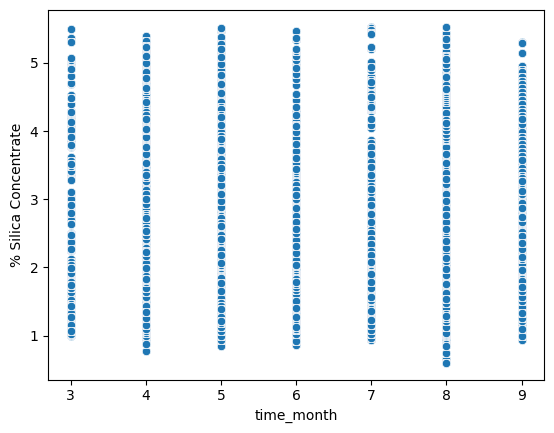

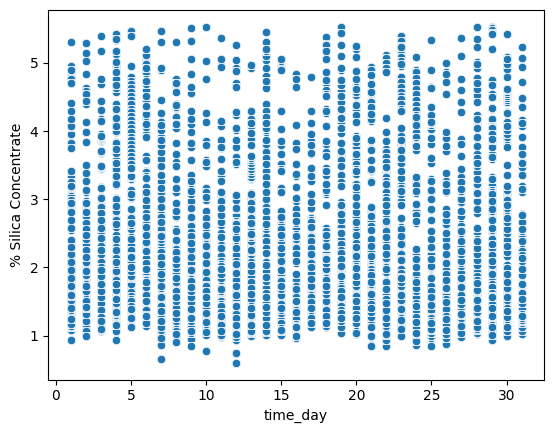

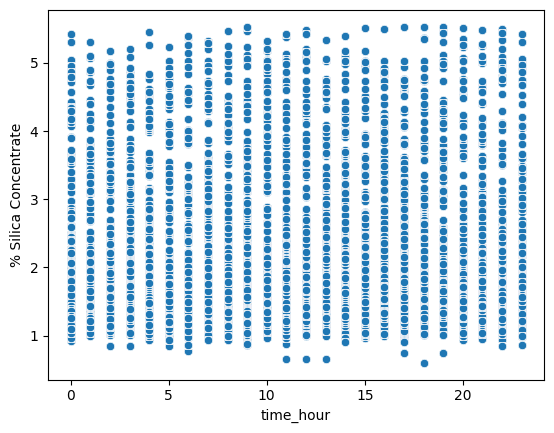

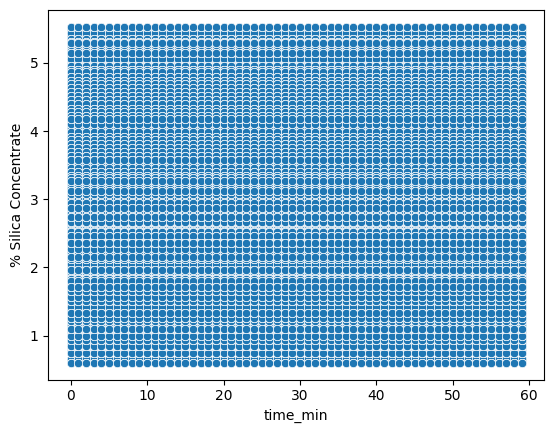

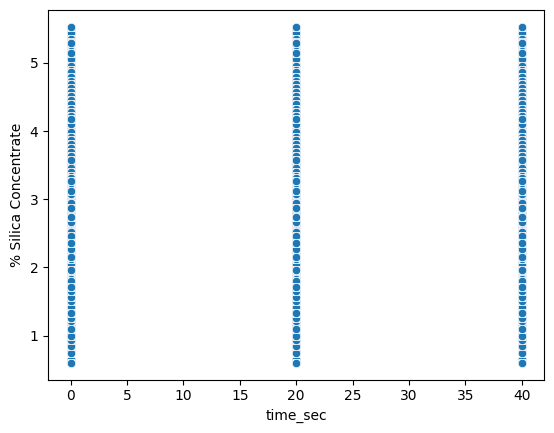

In [84]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.scatterplot(data=df_yclean, x=col, y='% Silica Concentrate')

In [91]:
df_yclean.groupby(['time_time']).mean()

C:\Users\Ling\AppData\Local\Temp\ipykernel_8924\209628110.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_yclean.groupby(['time_time']).mean()


,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate,time_month,time_day,time_hour,time_min,time_sec
time_time,,,,,,,,,,,,,,,,,,,,,
00:00:00,56.487706,14.237588,2999.674747,479.564184,397.625820,9.762958,1.679409,281.543581,278.506979,281.313957,...,418.083898,422.465610,418.404362,65.159412,2.220000,6.029412,15.323529,0.0,0.0,0.0
00:00:20,56.487706,14.237588,2975.217103,480.179849,397.599438,9.762781,1.679188,281.539672,278.378747,281.426963,...,418.246838,423.305266,417.352713,65.159412,2.220000,6.029412,15.323529,0.0,0.0,20.0
00:00:40,56.487706,14.237588,3030.822476,480.553178,397.715546,9.762604,1.678955,281.533029,278.228404,281.467280,...,418.620484,421.495763,417.486293,65.159412,2.220000,6.029412,15.323529,0.0,0.0,40.0
00:01:00,56.487706,14.237588,3050.123570,478.967978,397.764243,9.762425,1.678725,281.593015,278.264795,281.338616,...,416.796484,418.846318,416.616480,65.159412,2.220000,6.029412,15.323529,0.0,1.0,0.0
00:01:20,56.487706,14.237588,3077.086770,480.065622,397.901933,9.762260,1.678927,281.678312,278.549964,281.427869,...,417.127195,419.127410,415.312190,65.159412,2.220000,6.029412,15.323529,0.0,1.0,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23:58:20,56.448304,14.290000,2972.867103,477.922440,397.314720,9.762951,1.679547,281.700093,279.002459,281.437232,...,417.569399,424.241799,414.548338,65.180819,2.185322,6.011696,15.368421,23.0,58.0,20.0
23:58:40,56.448304,14.290000,3010.980443,479.750875,397.496921,9.762787,1.679505,281.692102,278.920498,281.392308,...,416.616948,420.909161,414.896408,65.180819,2.185322,6.011696,15.368421,23.0,58.0,40.0
23:59:00,56.448304,14.290000,3004.083245,480.187509,397.060712,9.762602,1.679447,281.692760,278.598565,281.512045,...,418.168970,420.008175,415.822081,65.180819,2.185322,6.011696,15.368421,23.0,59.0,0.0


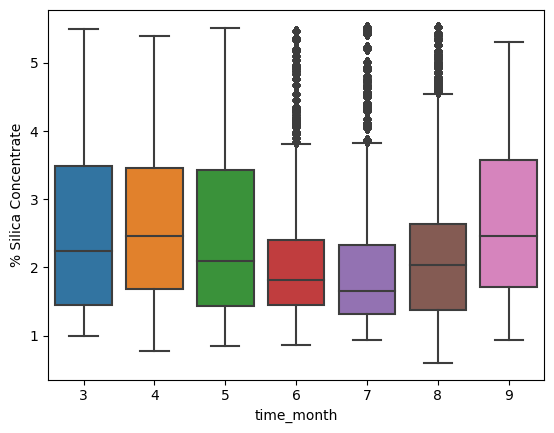

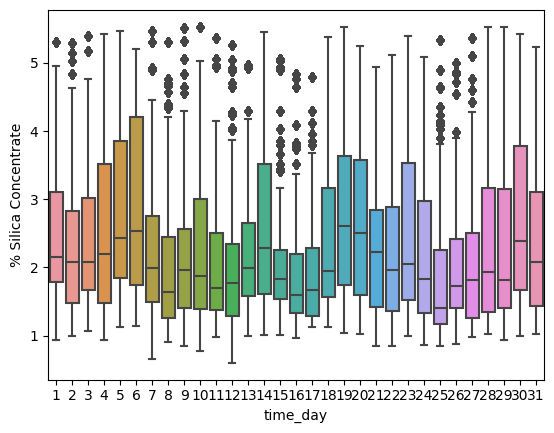

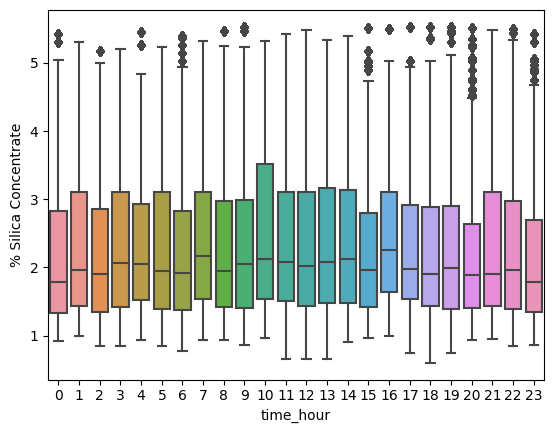

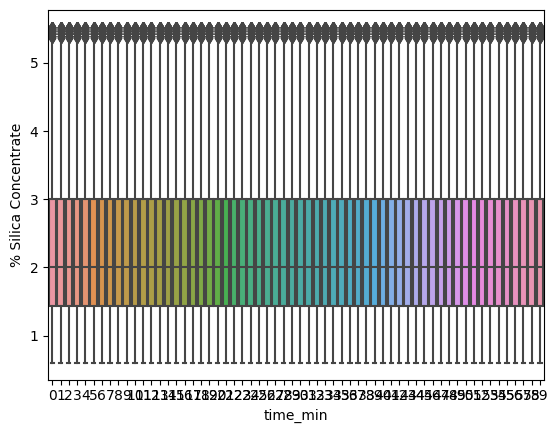

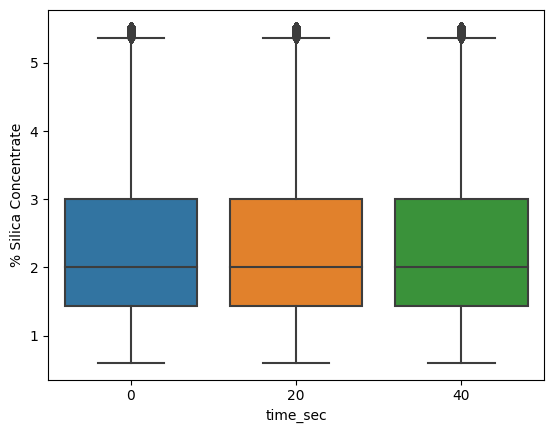

In [85]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec','time_time']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='% Silica Concentrate')

<AxesSubplot: xlabel='datetime', ylabel='% Silica Concentrate'>

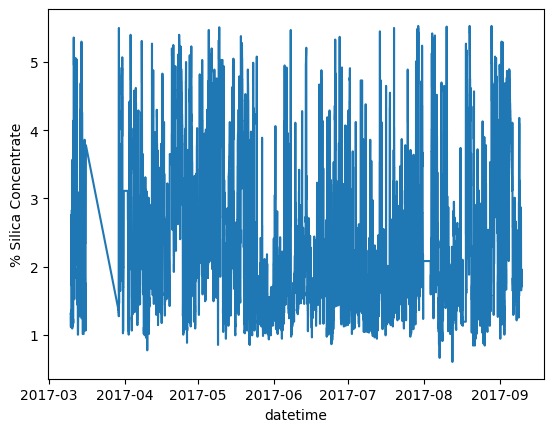

In [92]:
sns.lineplot(data=df_yclean, x='datetime', y='% Silica Concentrate')

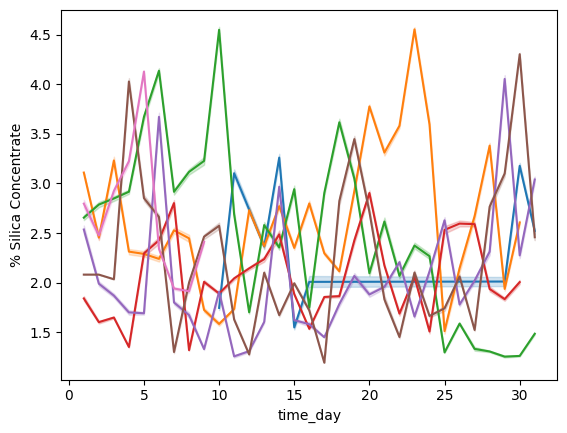

In [97]:
# 各月份每天的變化
for i in range(3, 10):
    df_temp = df_yclean[df_yclean['time_month']==i][['time_day', '% Silica Concentrate']]
    sns.lineplot(data=df_temp, x='time_day', y='% Silica Concentrate')

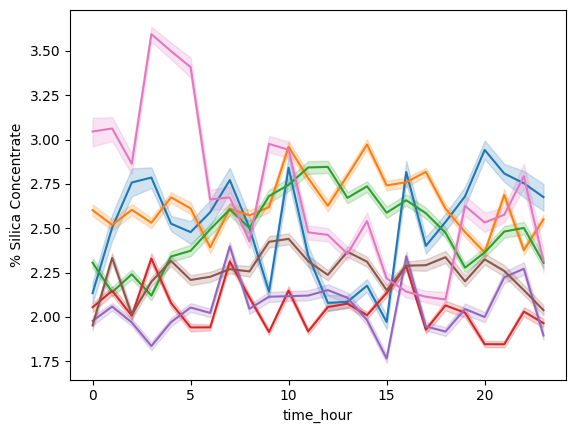

In [98]:
for i in range(3, 10):
    df_temp = df_yclean[df_yclean['time_month']==i][['time_hour', '% Silica Concentrate']]
    sns.lineplot(data=df_temp, x='time_hour', y='% Silica Concentrate')

## 每20秒的測量欄位之EDA

### 與y的關係

In [32]:
df_yclean.columns

Index(['date', '% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level',
       '% Iron Concentrate', '% Silica Concentrate', 'datetime', 'time_month',
       'time_day', 'time_hour', 'time_min', 'time_sec', 'time_time'],
      dtype='object')

Starch Flow
-0.06625946305337889
Amina Flow
0.15678981429461294
Ore Pulp Flow
0.008340315779086492
Ore Pulp pH
-0.1479628728601304
Ore Pulp Density
0.046924893359548386
Flotation Column 01 Air Flow
-0.21927443606427643
Flotation Column 02 Air Flow
-0.16742633938552504
Flotation Column 03 Air Flow
-0.21903172701848891
Flotation Column 04 Air Flow
-0.005000520852763649
Flotation Column 05 Air Flow
-0.009292571650484645
Flotation Column 06 Air Flow
-0.04968273217136856
Flotation Column 07 Air Flow
-0.07182504764301677
Flotation Column 01 Level
0.017094350848914582
Flotation Column 02 Level
0.030903845190547303
Flotation Column 03 Level
0.01457034985740173
Flotation Column 04 Level
-0.14965398109897154
Flotation Column 05 Level
-0.16934924982807859
Flotation Column 06 Level
-0.10250874670342375
Flotation Column 07 Level
-0.14150802538007443


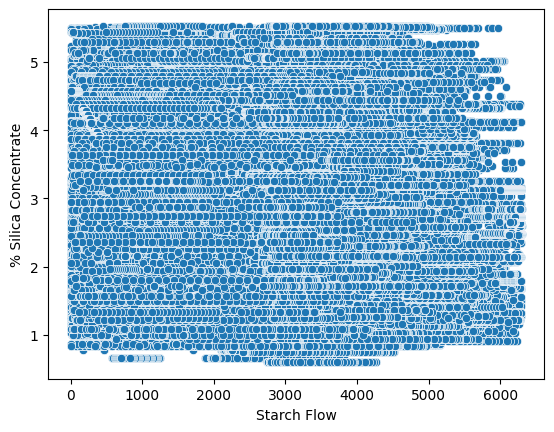

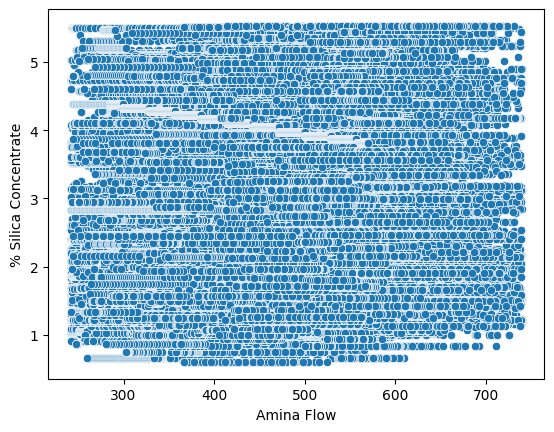

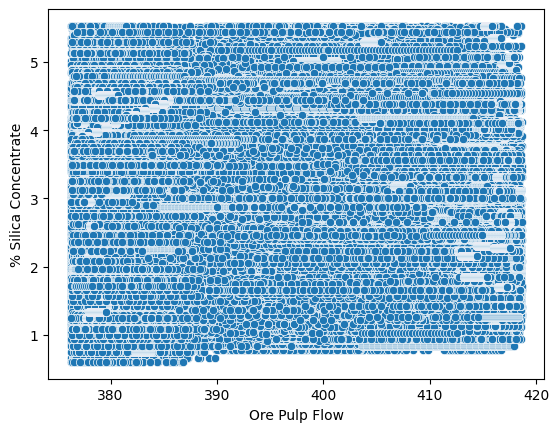

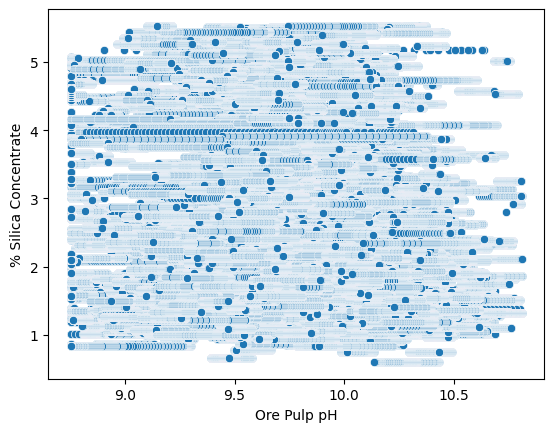

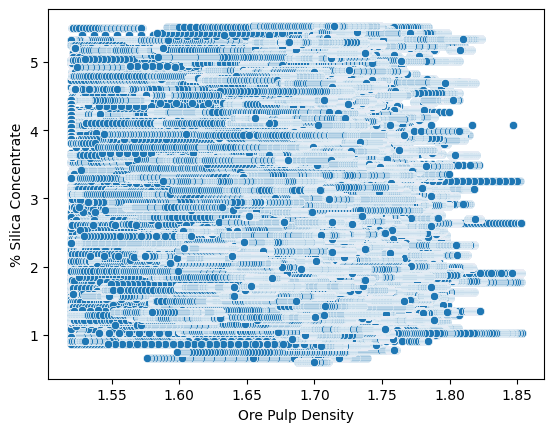

...

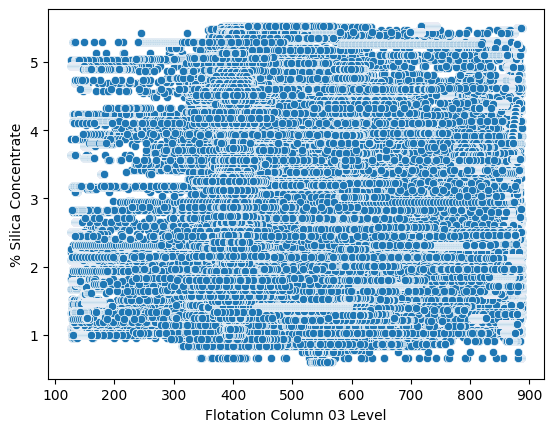

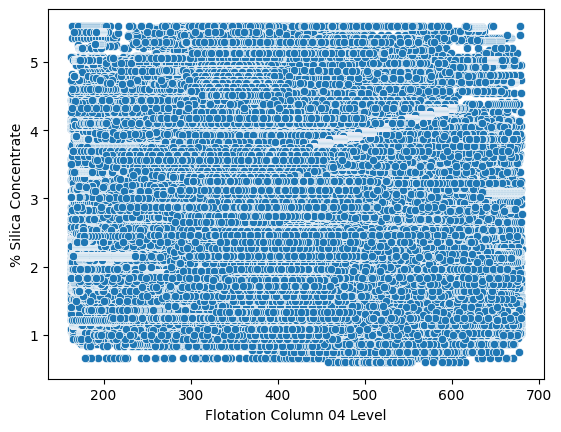

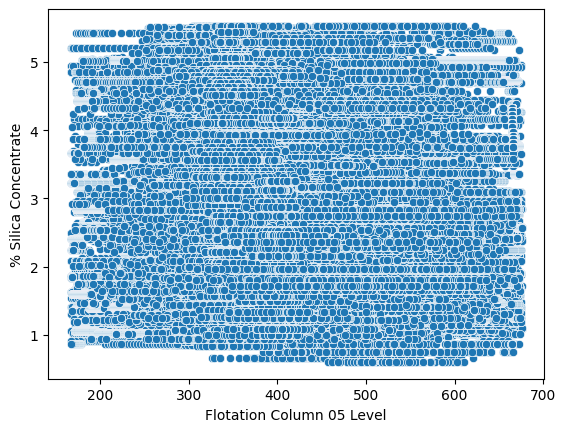

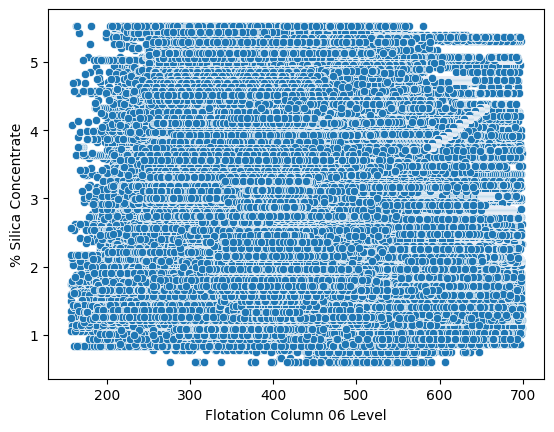

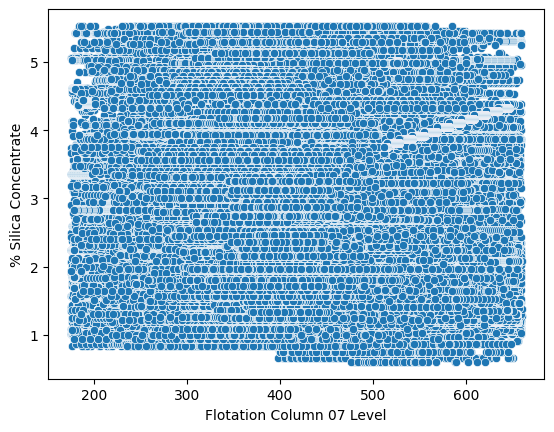

In [38]:
for i, col in enumerate([u for u in df_yclean.columns if (u[:4]!='time') & (u[:4]!='date') & (u[0]!='%')]):
    print(col)
    print(df_corr.loc['% Silica Concentrate', col])
    plt.figure(i)
    sns.scatterplot(data=df_yclean, x=col, y='% Silica Concentrate')

### 與時間的關係

In [39]:
[u for u in df_yclean.columns if (u[:4]!='time') & (u[:4]!='date') & (u[0]!='%')]

['Starch Flow',
 'Amina Flow',
 'Ore Pulp Flow',
 'Ore Pulp pH',
 'Ore Pulp Density',
 'Flotation Column 01 Air Flow',
 'Flotation Column 02 Air Flow',
 'Flotation Column 03 Air Flow',
 'Flotation Column 04 Air Flow',
 'Flotation Column 05 Air Flow',
 'Flotation Column 06 Air Flow',
 'Flotation Column 07 Air Flow',
 'Flotation Column 01 Level',
 'Flotation Column 02 Level',
 'Flotation Column 03 Level',
 'Flotation Column 04 Level',
 'Flotation Column 05 Level',
 'Flotation Column 06 Level',
 'Flotation Column 07 Level']

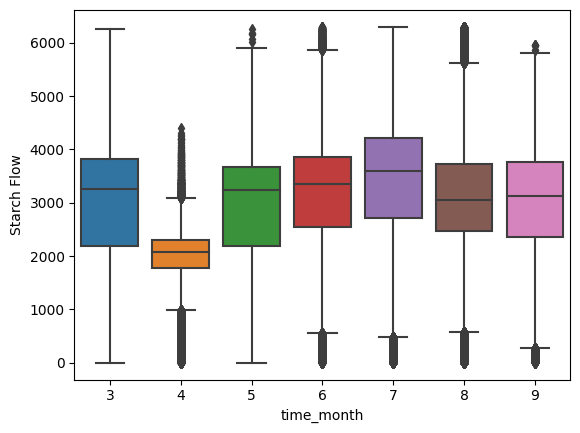

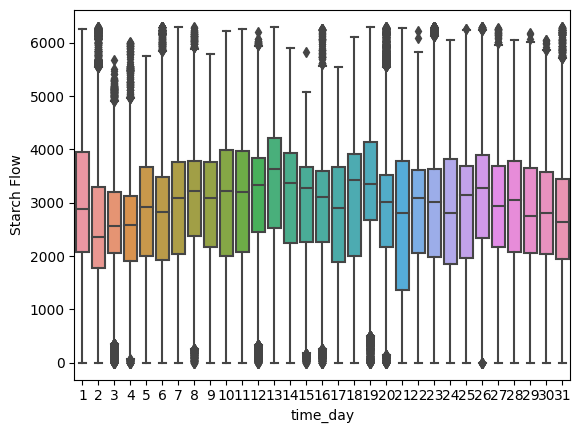

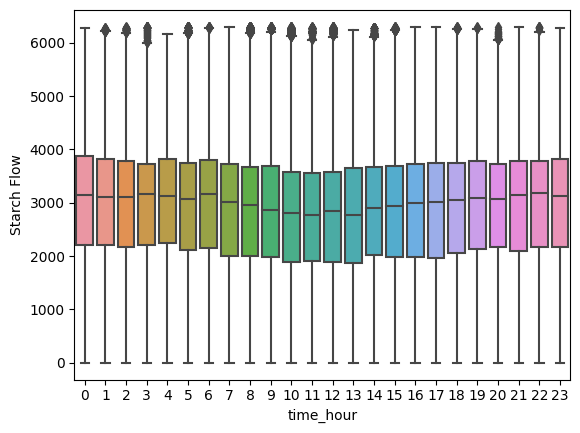

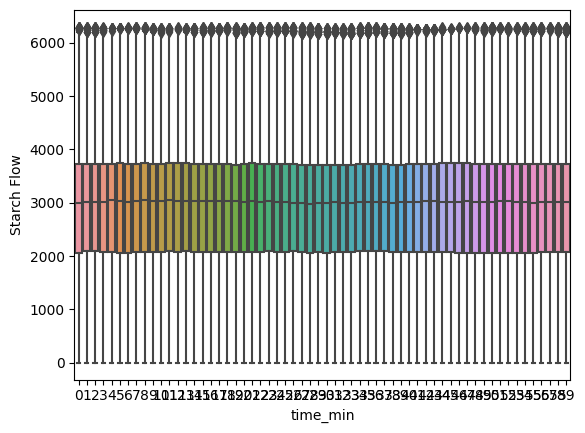

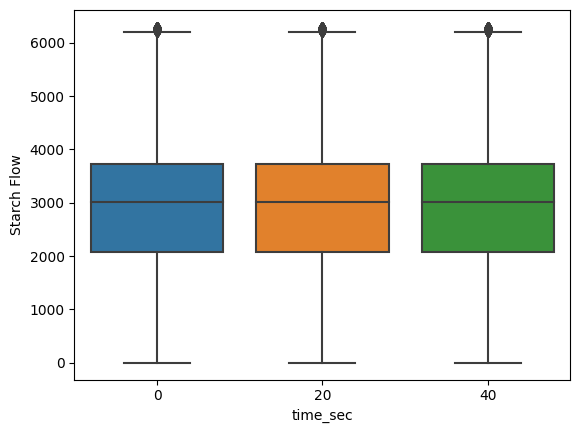

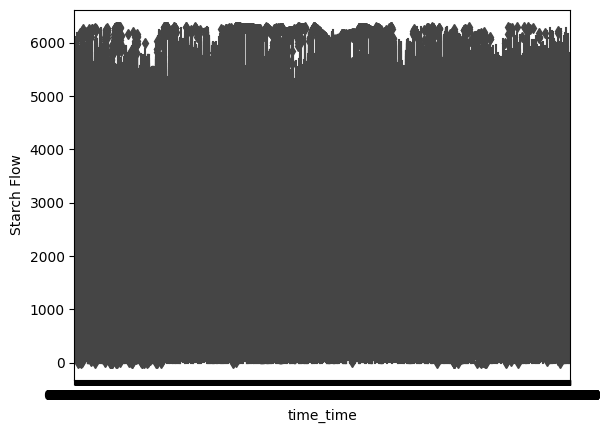

In [40]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Starch Flow')

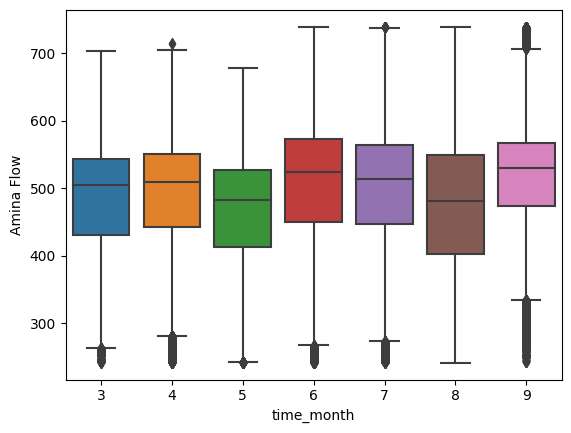

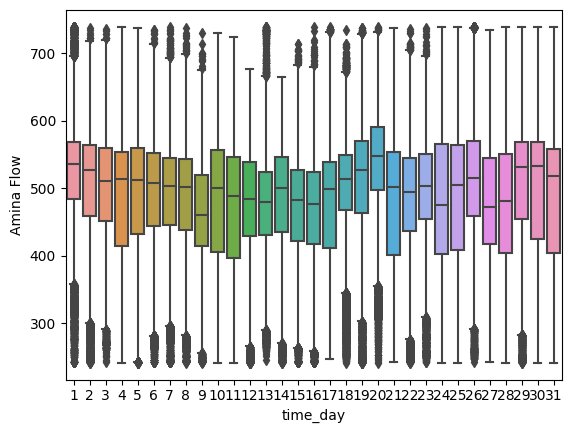

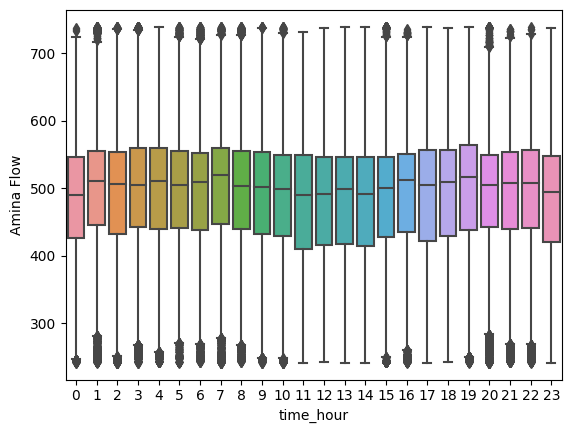

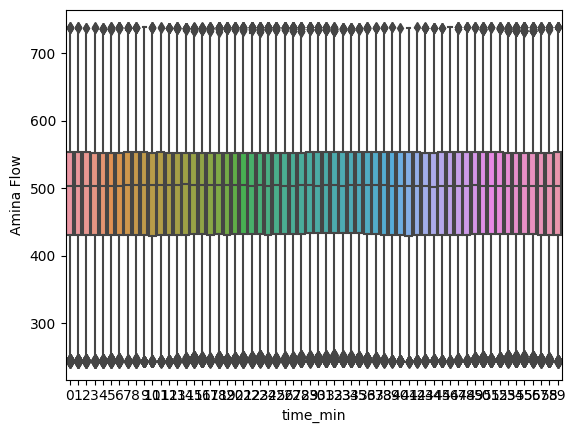

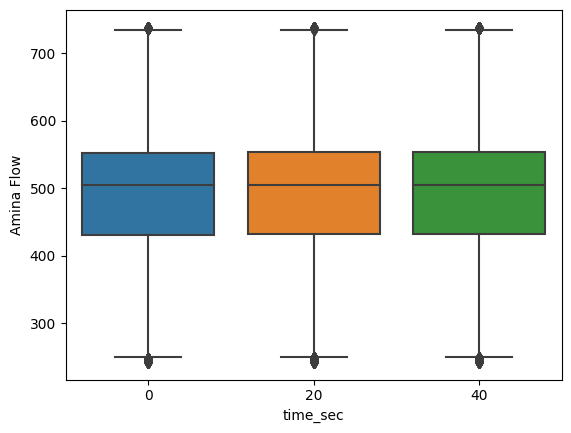

In [41]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Amina Flow')

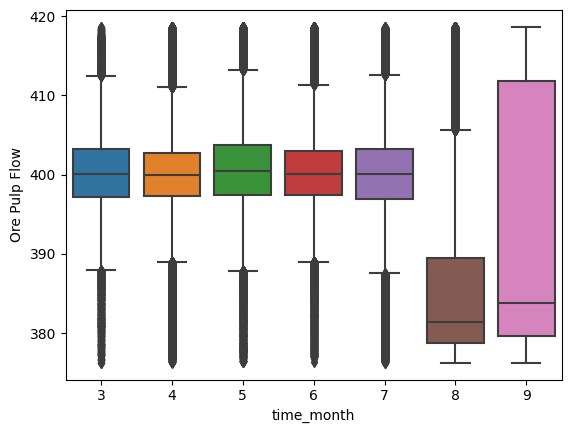

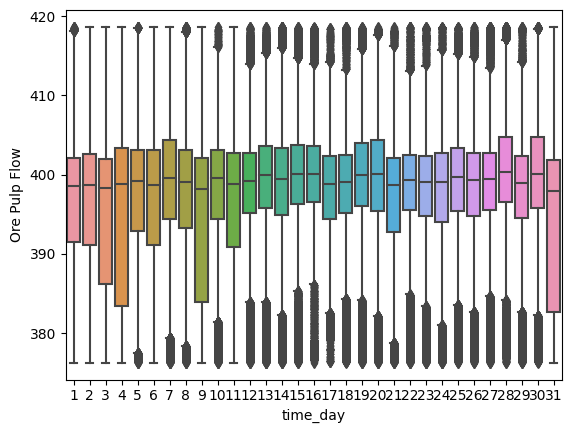

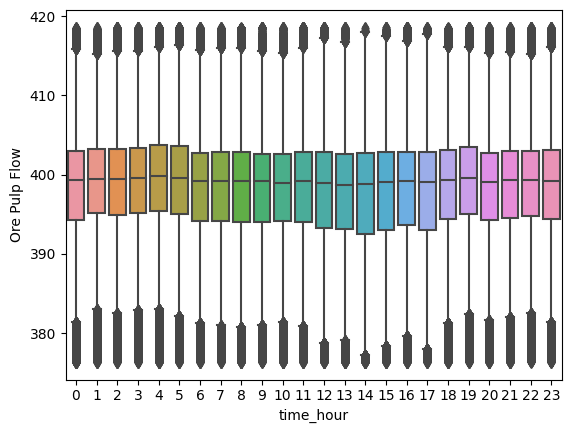

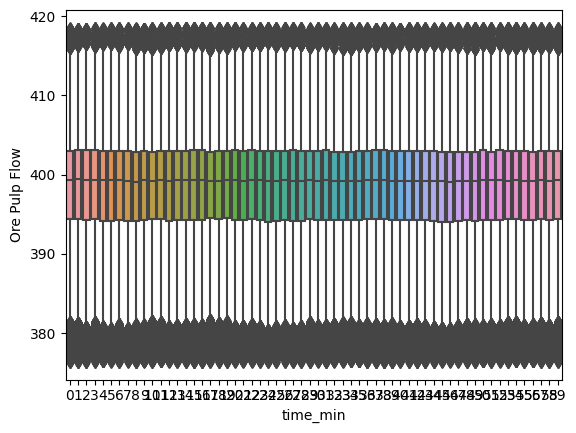

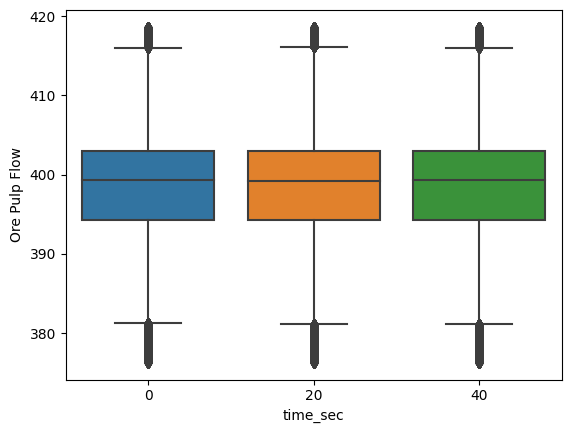

In [42]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Ore Pulp Flow')

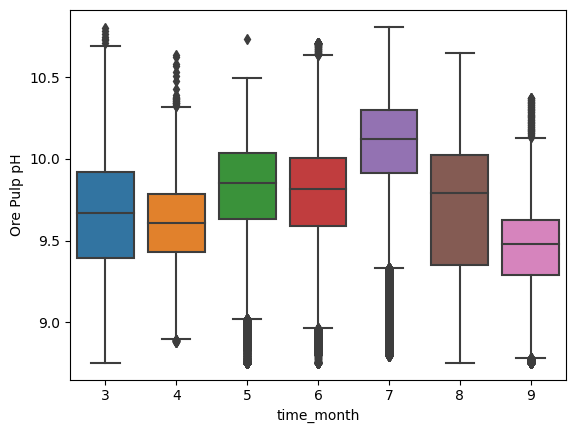

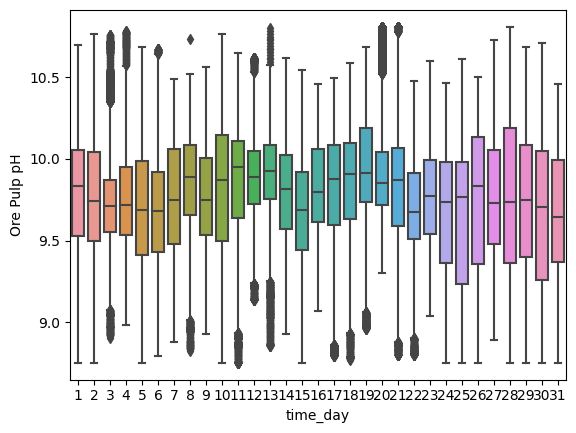

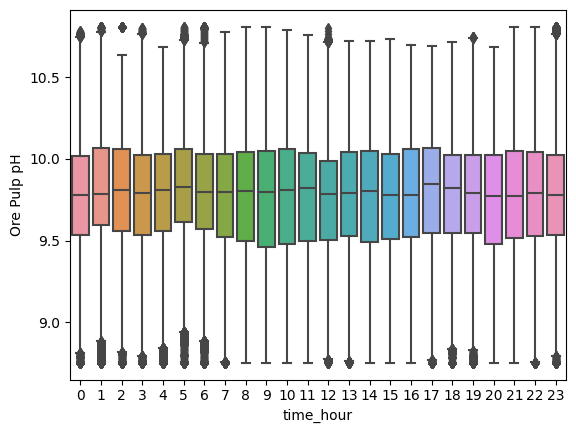

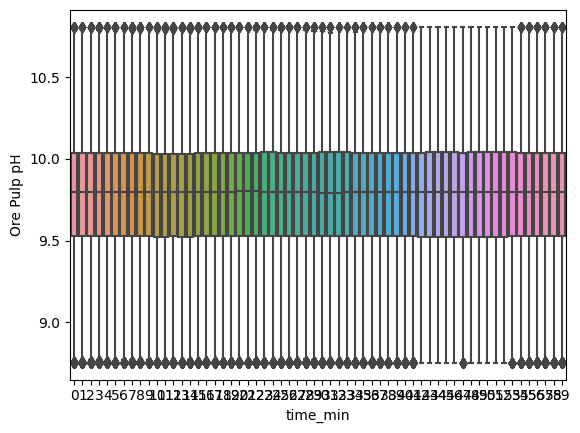

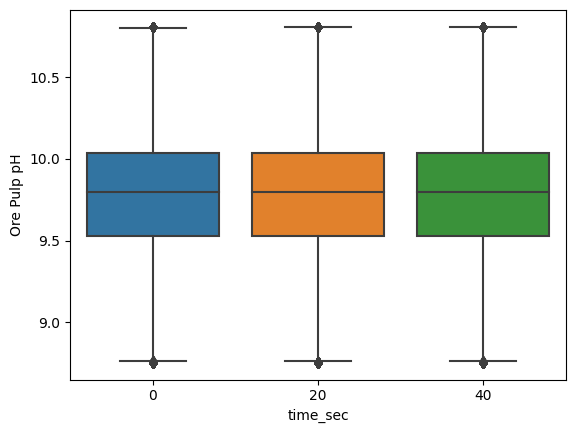

In [43]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Ore Pulp pH')

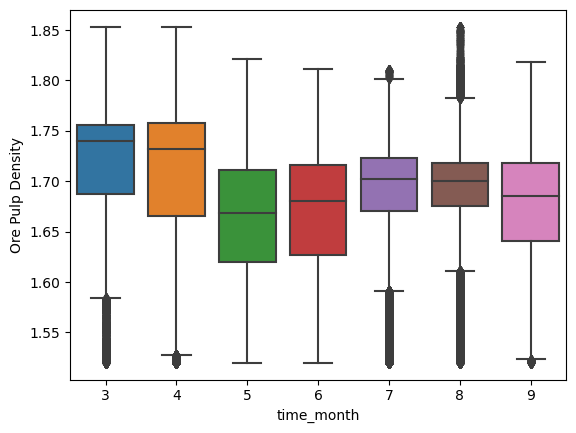

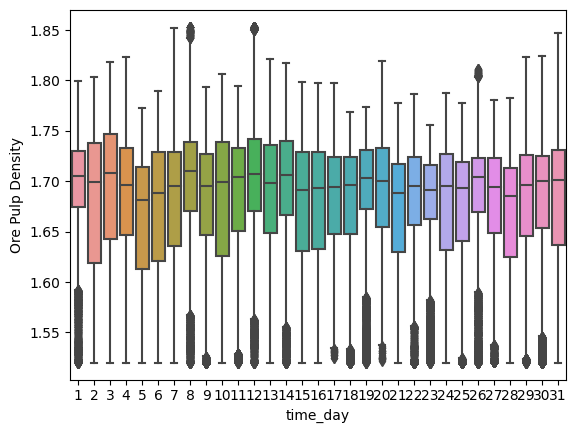

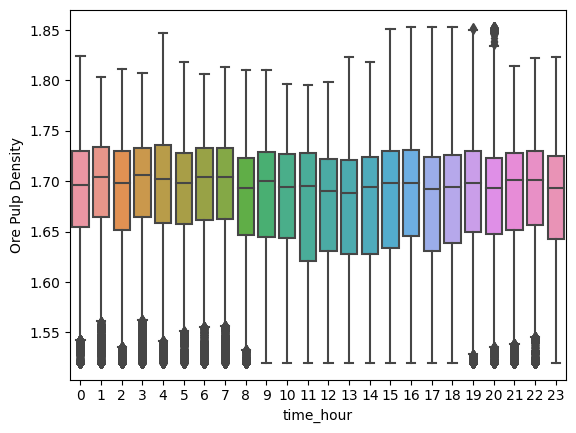

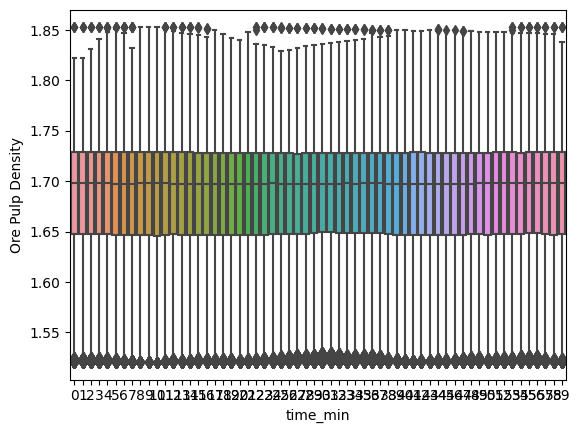

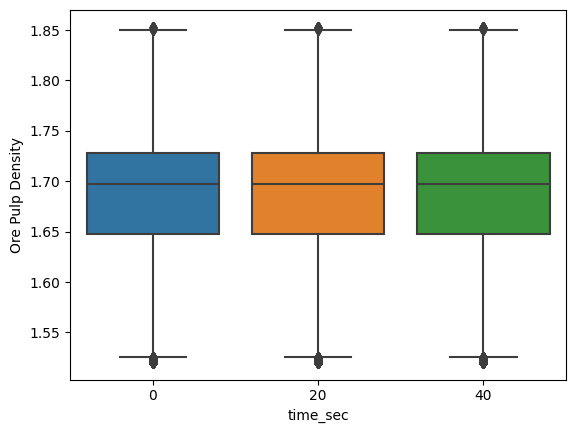

In [44]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Ore Pulp Density')

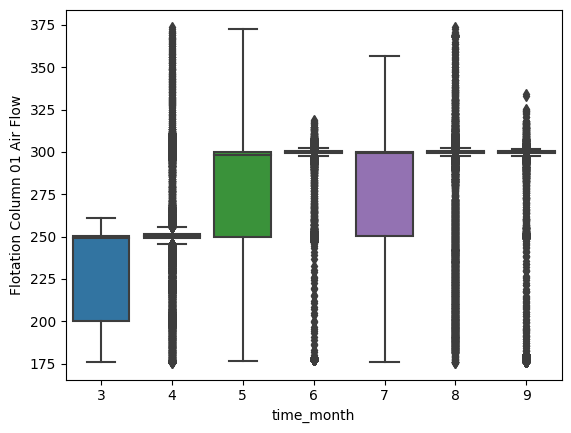

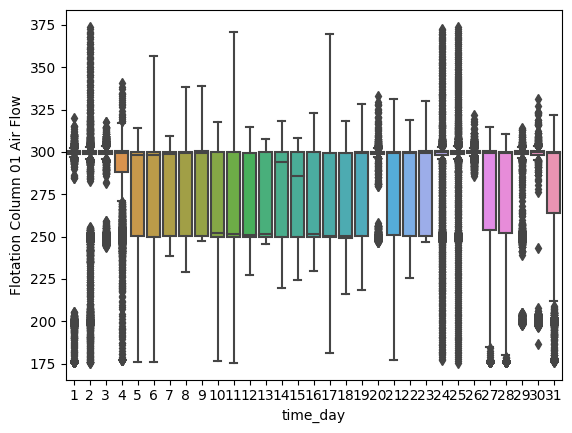

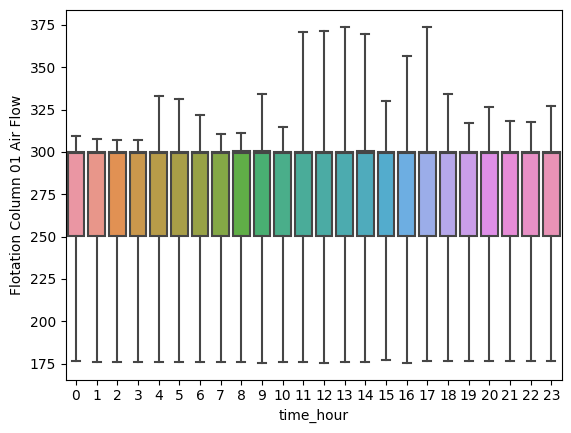

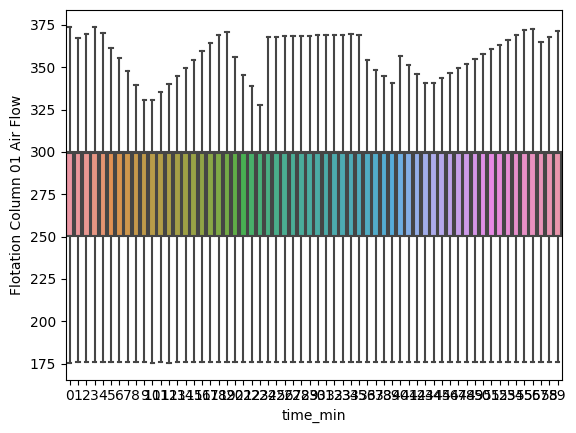

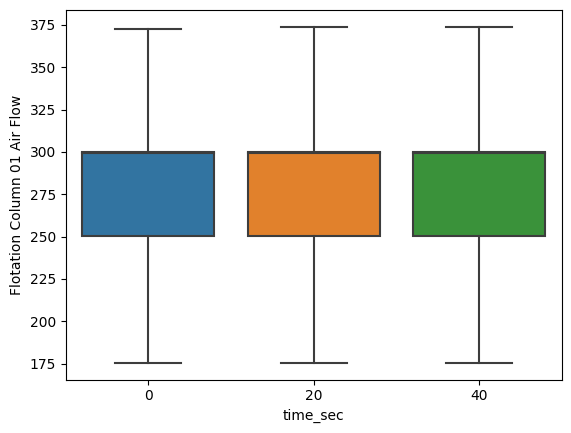

In [45]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 01 Air Flow')

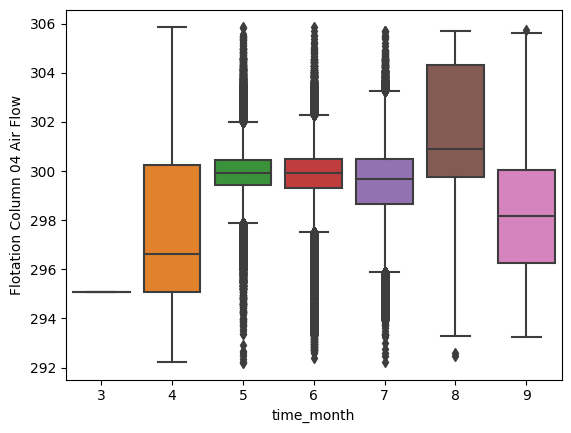

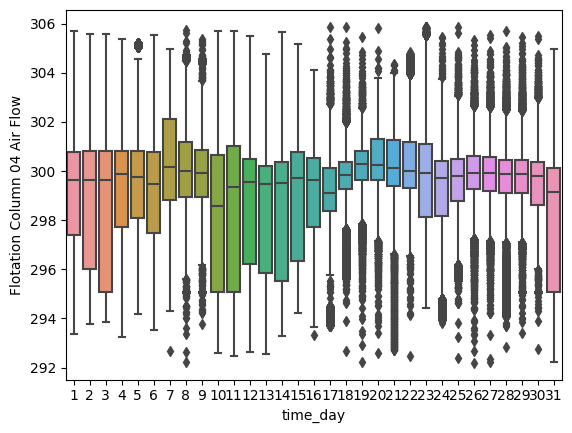

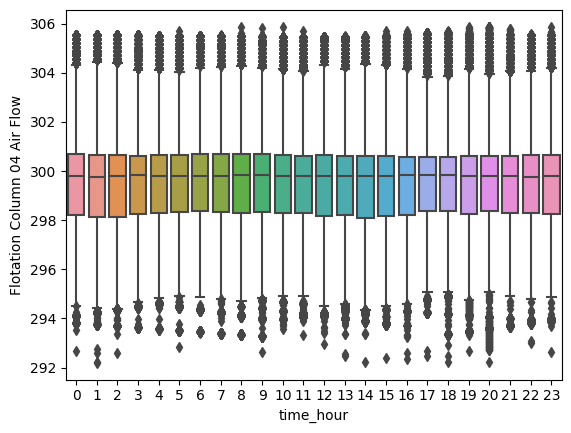

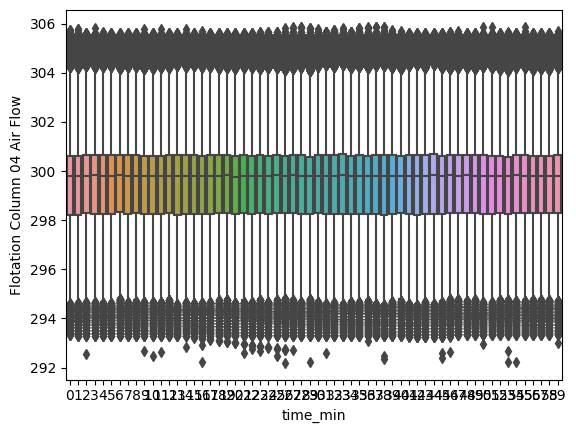

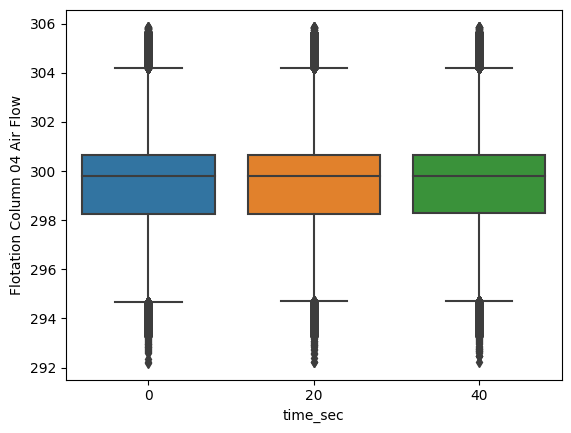

In [46]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 04 Air Flow')

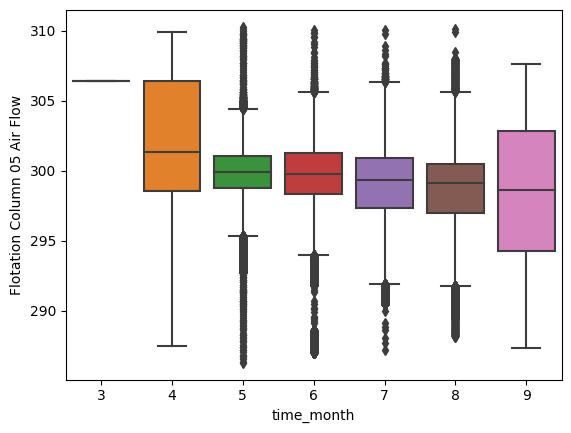

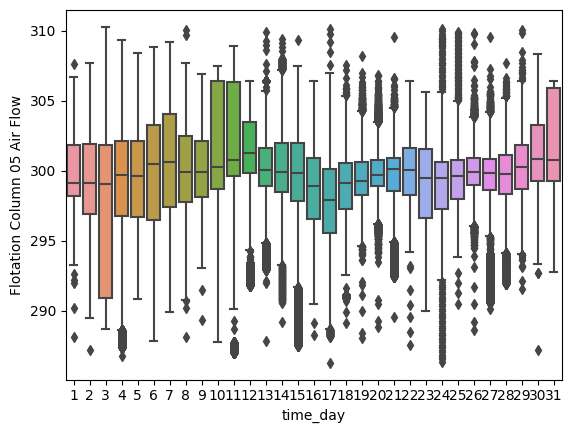

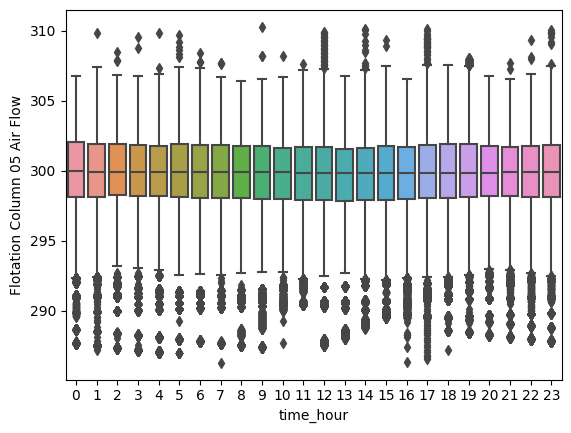

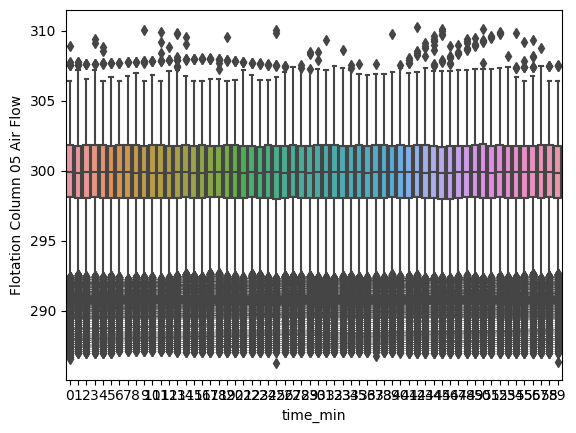

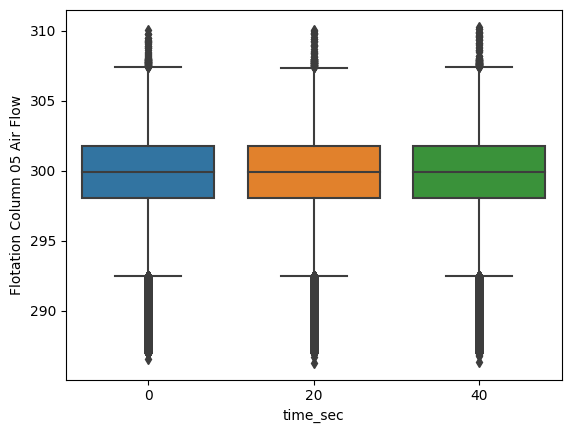

In [47]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 05 Air Flow')

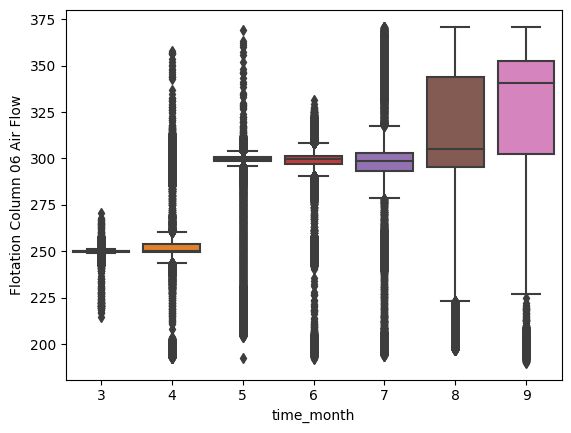

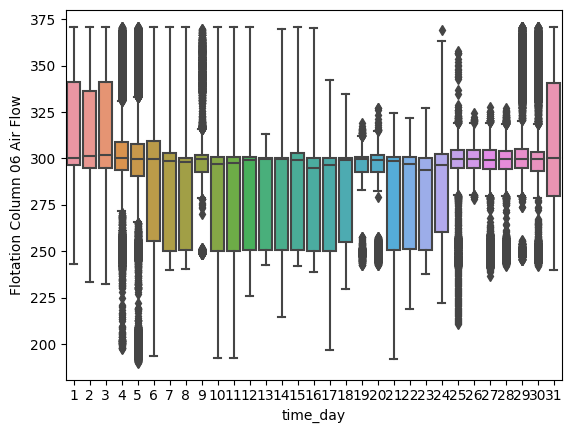

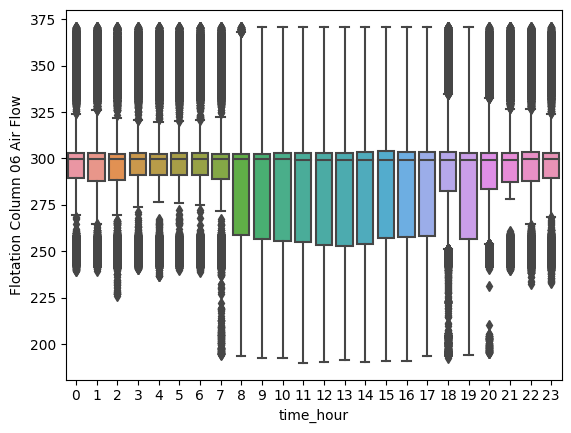

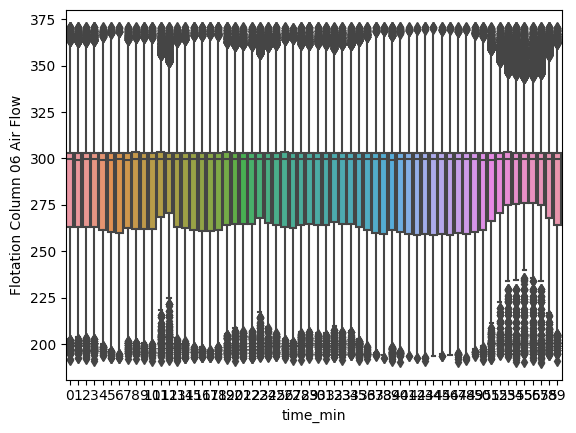

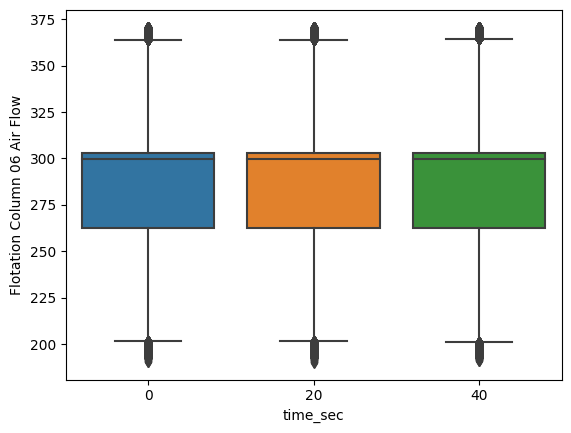

In [48]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 06 Air Flow')

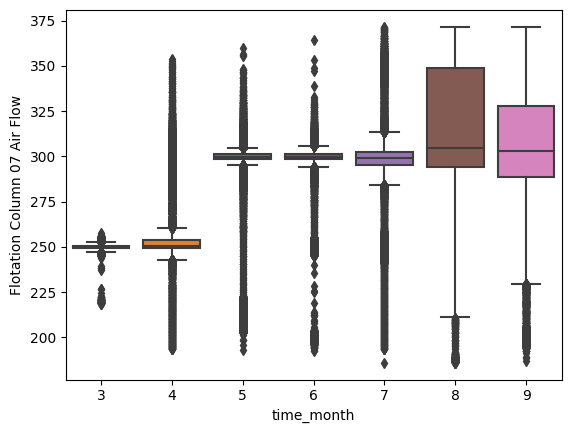

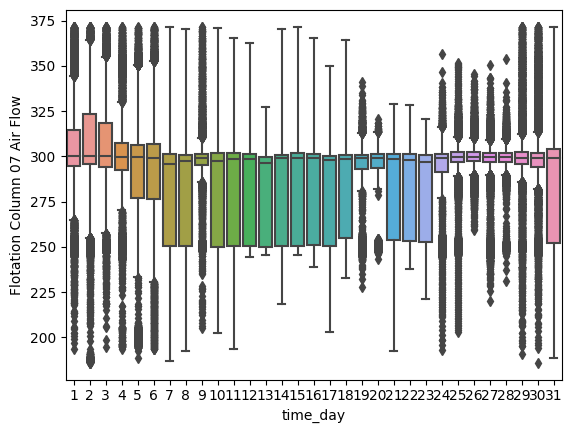

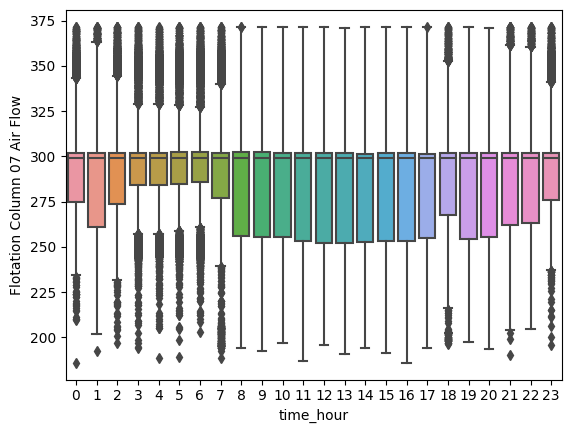

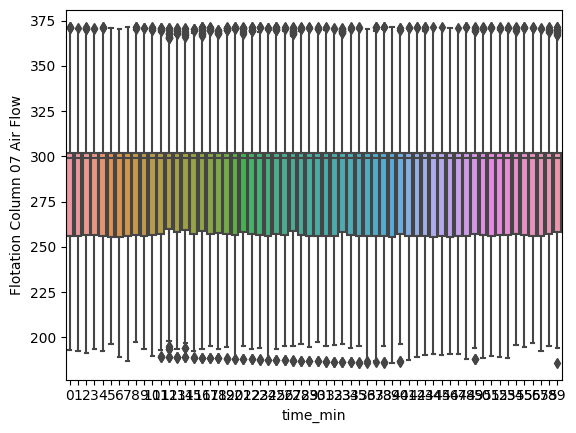

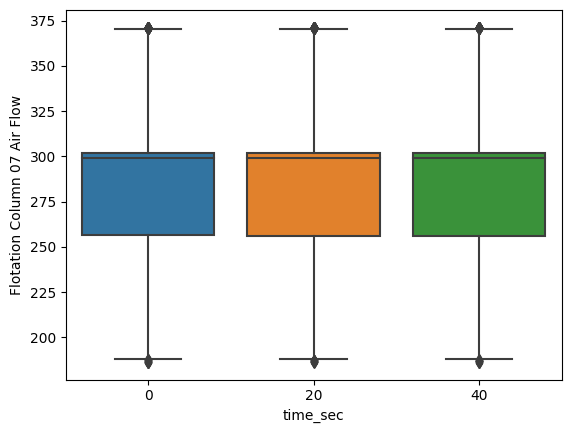

In [49]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 07 Air Flow')

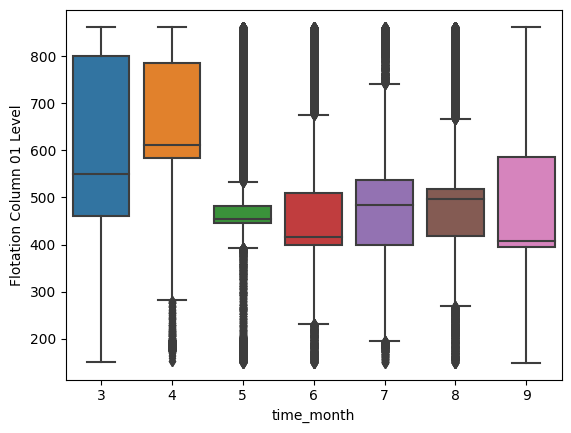

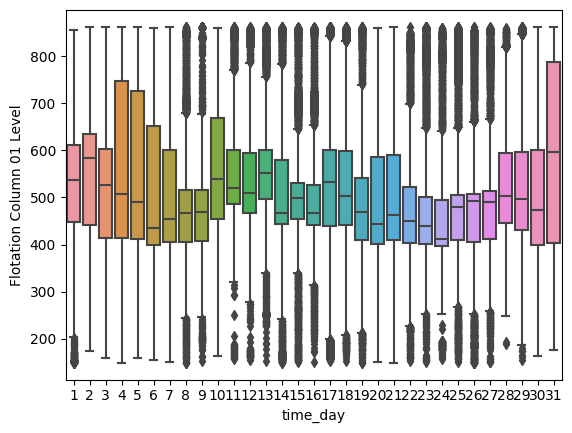

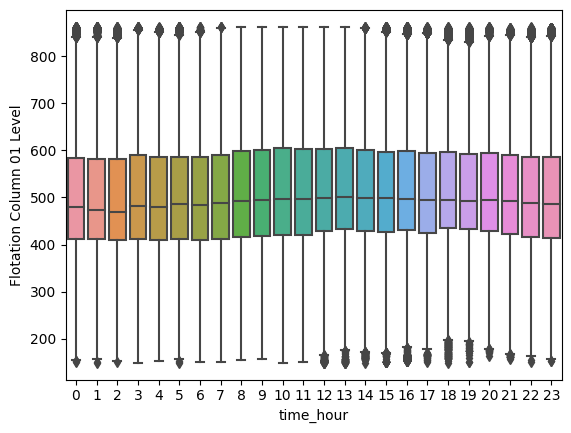

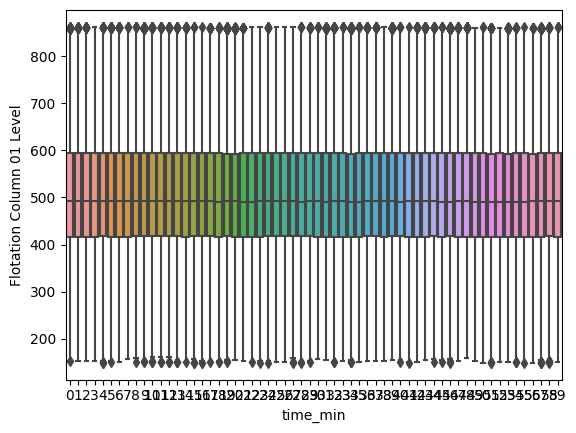

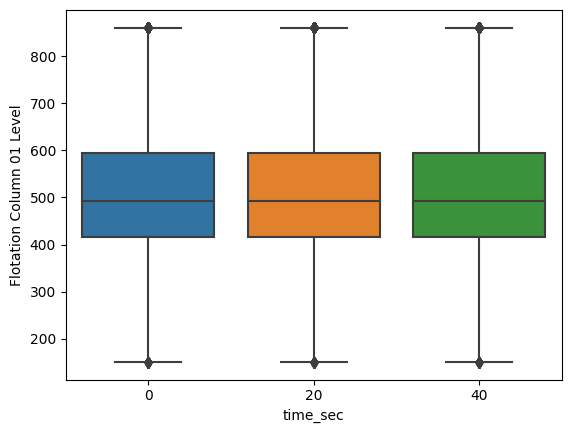

In [50]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 01 Level')

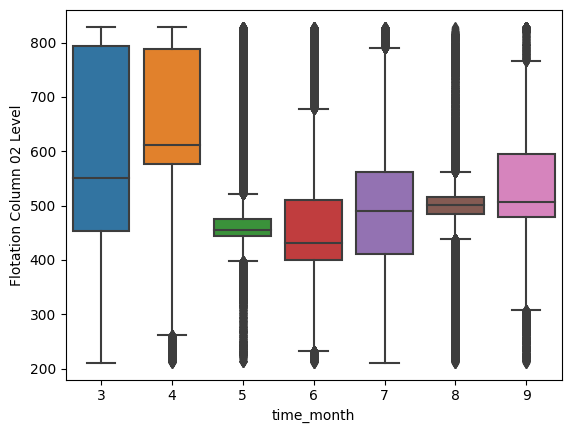

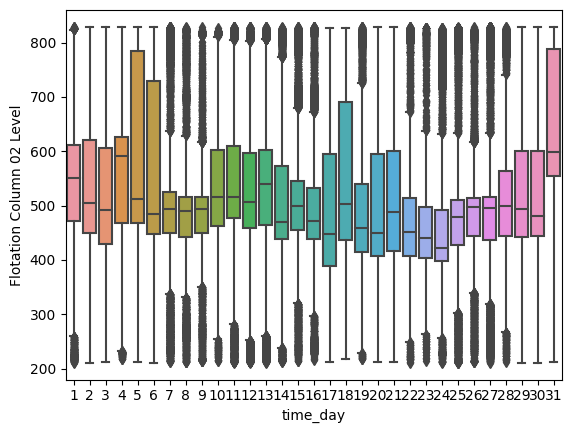

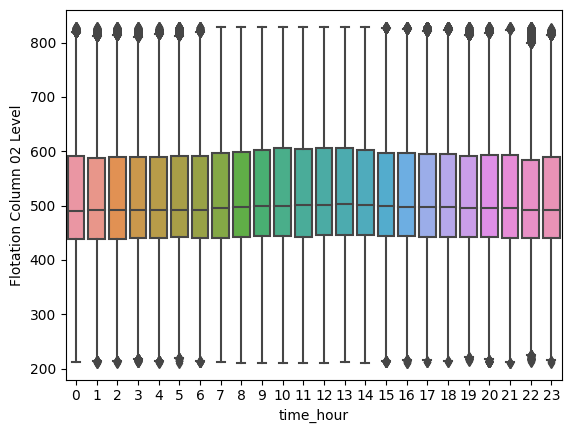

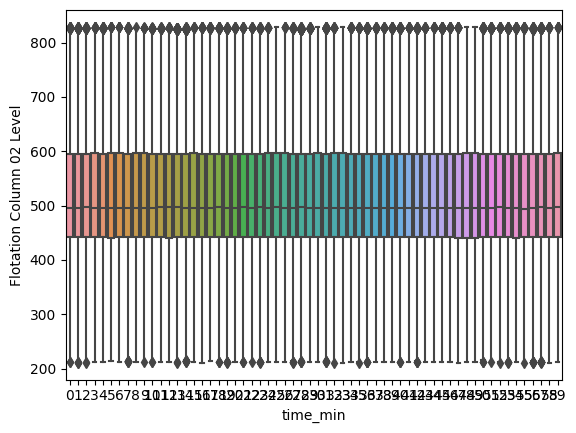

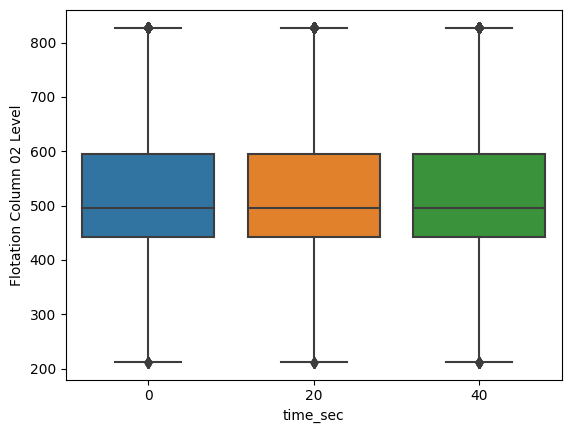

In [51]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 02 Level')

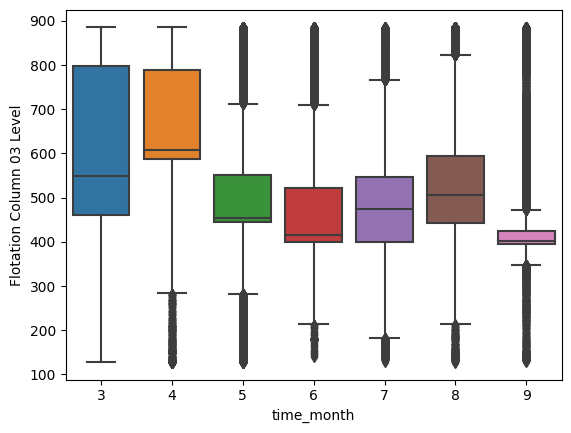

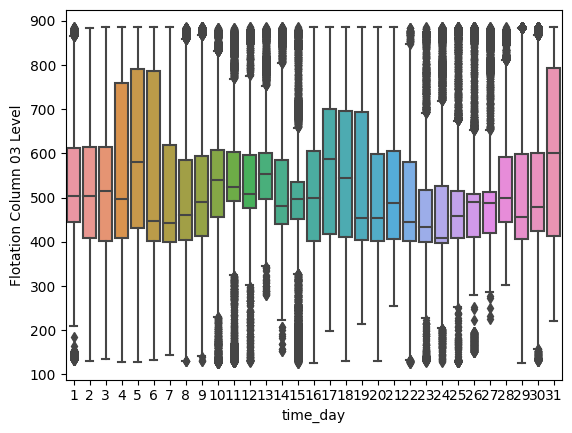

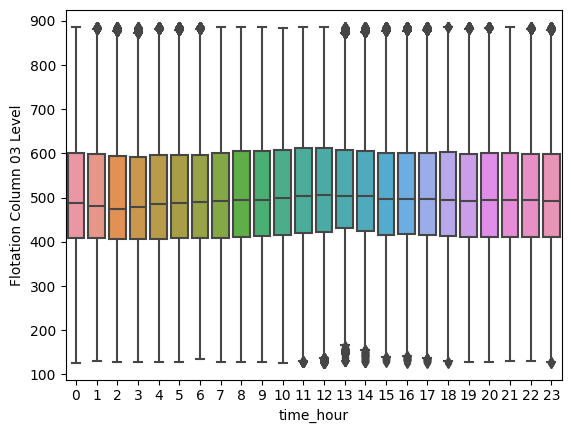

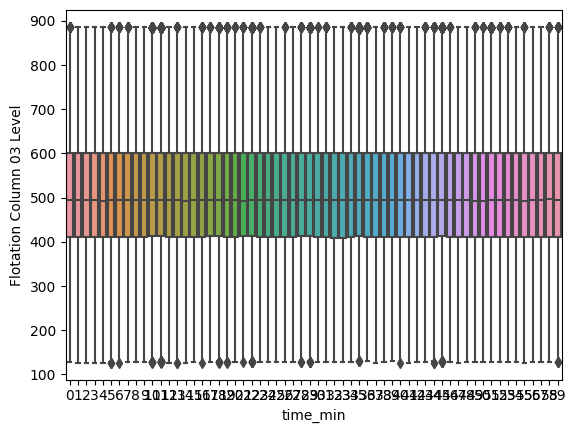

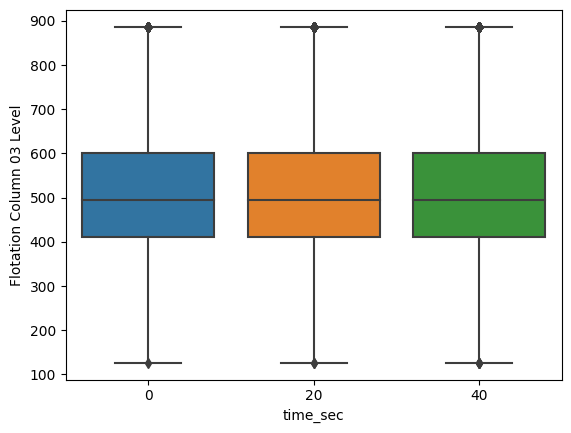

In [52]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 03 Level')

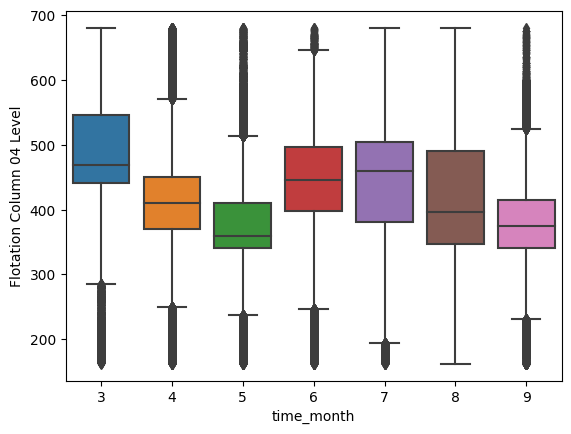

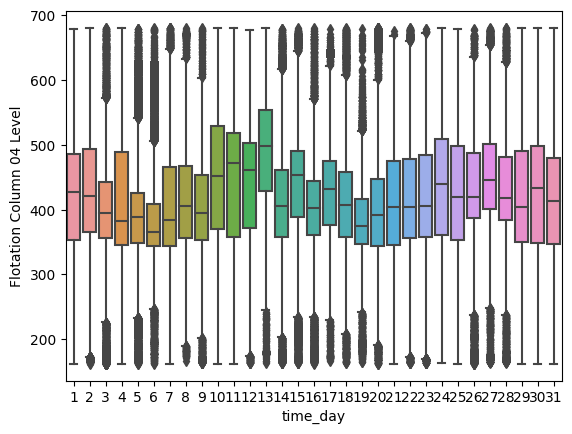

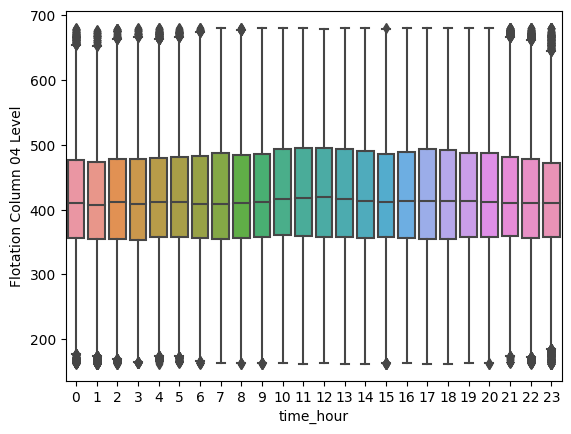

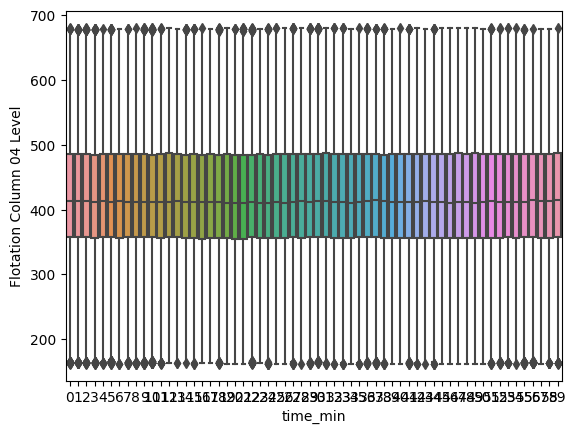

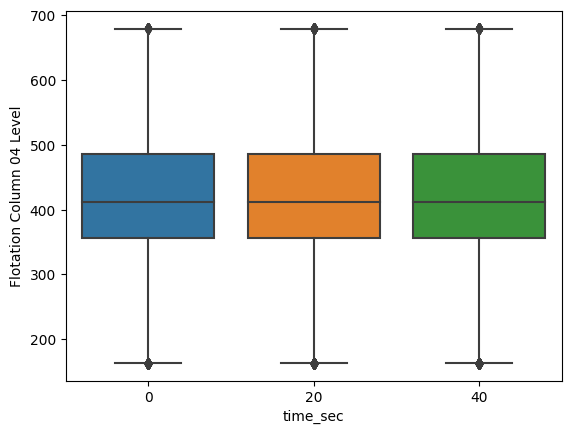

In [53]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 04 Level')

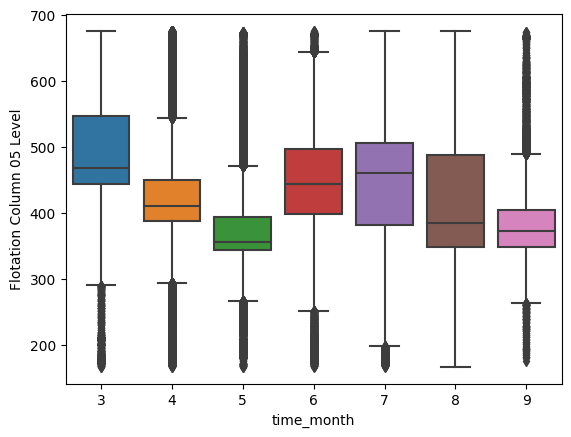

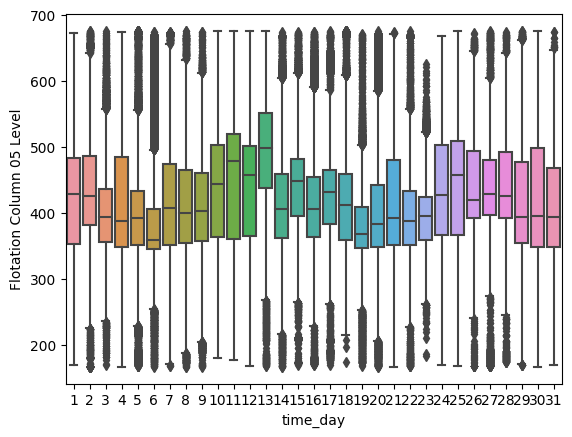

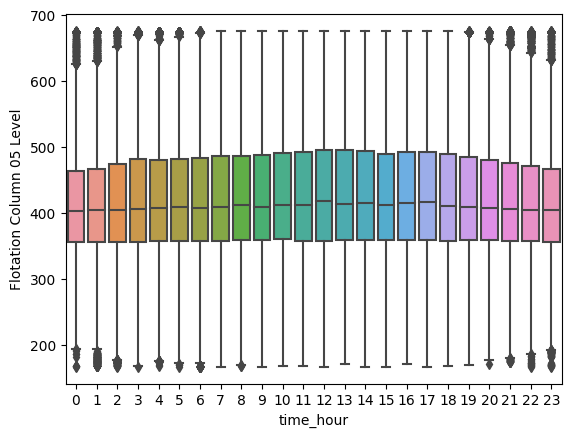

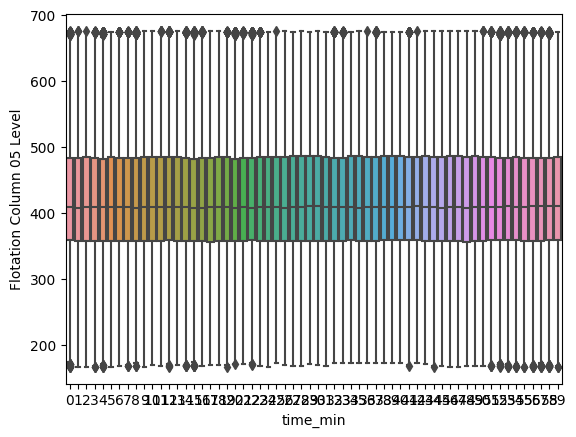

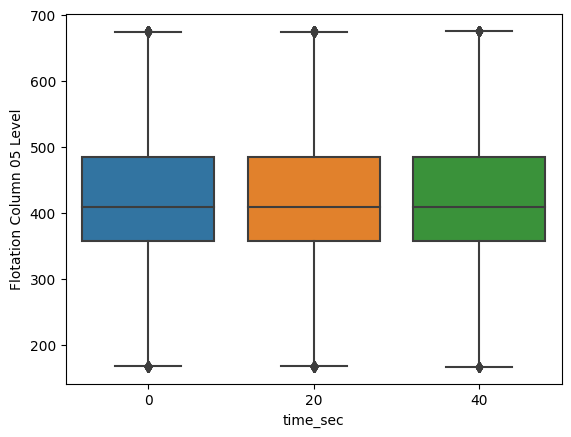

In [54]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 05 Level')

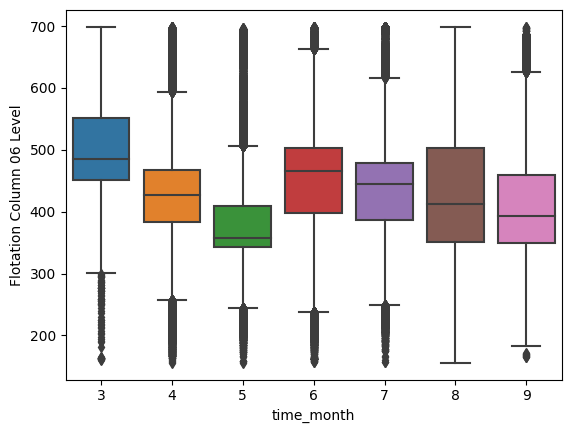

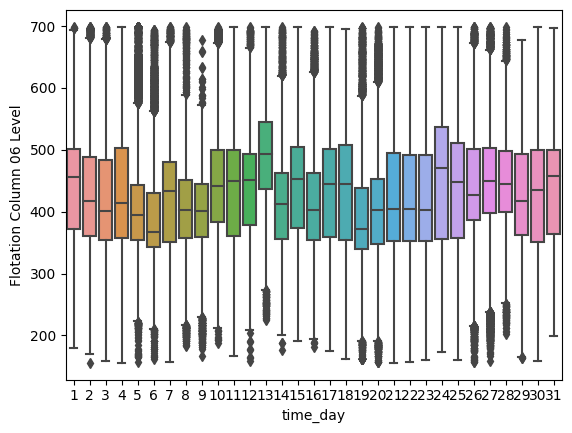

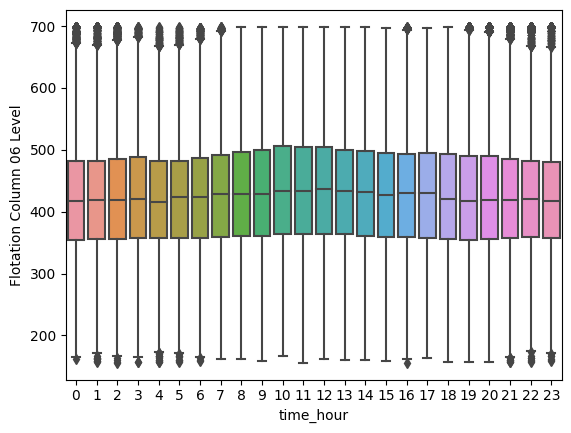

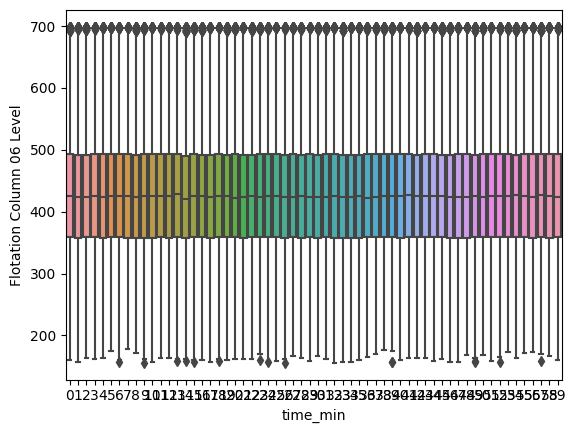

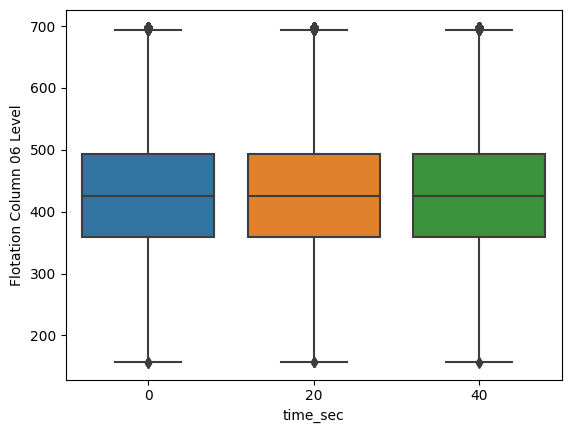

In [55]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 06 Level')

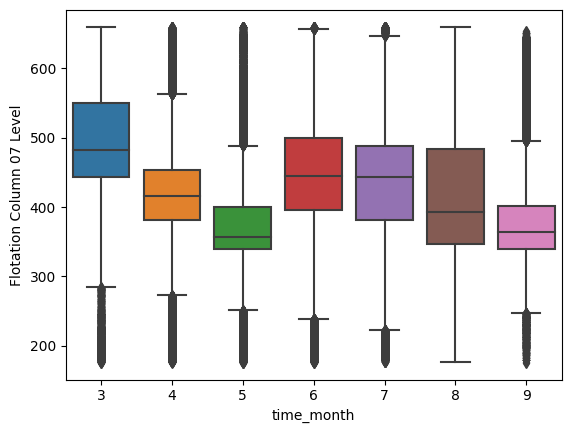

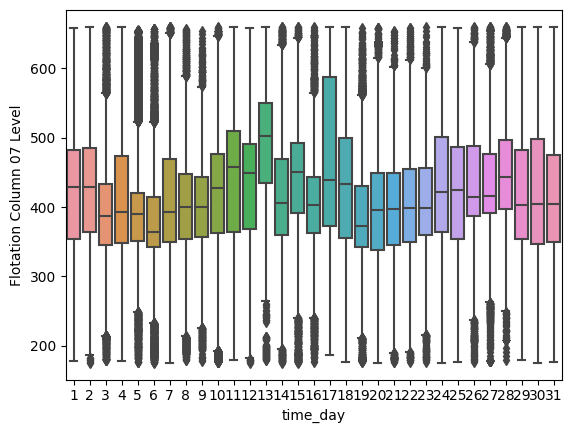

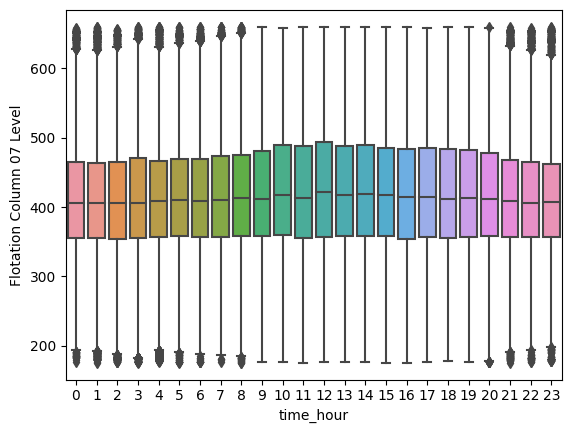

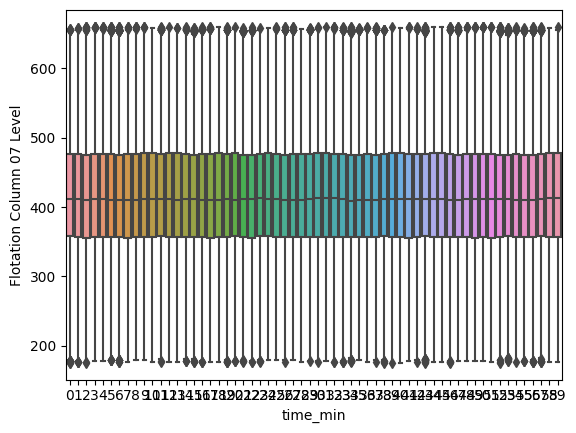

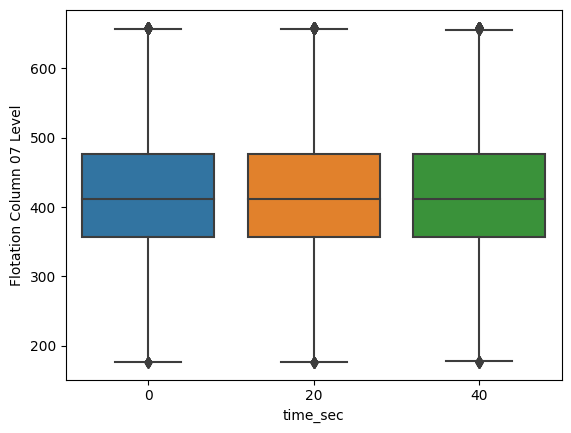

In [56]:
for i, col in enumerate(['time_month', 'time_day', 'time_hour', 'time_min', 'time_sec']):
    plt.figure(i)
    sns.boxplot(data=df_yclean, x=col, y='Flotation Column 07 Level')

## training

base line  
* 取第一筆資料訓練預測這一小時
* 取第一筆資料訓練預測下一小時
* 取該小時平均資料訓練預測這一小時

### 取第一筆資料做GBT

In [65]:
df_yclean['date'].min()
df_yclean['date'].max()

Timestamp('2017-09-09 23:00:00')

In [63]:
df_first = df_yclean.drop_duplicates(subset=['date'], keep='first')

In [66]:
train, test = df_first[df_first['date'] < '2017-08-10 00:00:00'], df_first[df_first['date'] >= '2017-08-10 00:00:00']

In [70]:
df_yclean.columns

Index(['date', '% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level',
       '% Iron Concentrate', '% Silica Concentrate', 'datetime', 'time_month',
       'time_day', 'time_hour', 'time_min', 'time_sec', 'time_time'],
      dtype='object')

In [71]:
X_train, Y_train = train[[u for u in df_yclean.columns if u not in ['date', 'datetime', '% Iron Concentrate', '% Silica Concentrate', 'time_time']]],  train['% Silica Concentrate']

In [74]:
X_test, Y_test = test[[u for u in df_yclean.columns if u not in ['date', 'datetime', '% Iron Concentrate', '% Silica Concentrate', 'time_time']]],  test['% Silica Concentrate']

In [75]:
from sklearn.ensemble import GradientBoostingRegressor
rg_gbt = GradientBoostingRegressor(n_estimators=100, learning_rate=0.01, random_state=100).fit(X_train, Y_train)

In [78]:
rg_gbt.feature_importances_

array([0.01526966, 0.04641373, 0.        , 0.13606248, 0.0008601 ,
       0.        , 0.0176351 , 0.17766942, 0.        , 0.12190715,
       0.19163202, 0.02296031, 0.00723529, 0.00948548, 0.00618017,
       0.01985057, 0.00063337, 0.02441337, 0.03930899, 0.0011193 ,
       0.01541264, 0.07838816, 0.06361512, 0.00394755, 0.        ,
       0.        ])

In [82]:
X_train.columns

Index(['% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level', 'time_month',
       'time_day', 'time_hour', 'time_min', 'time_sec'],
      dtype='object')

In [81]:
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
Y_test_pre = rg_gbt.predict(X_test)
print(mean_squared_error(Y_test, Y_test_pre, squared=False))
print(mean_absolute_percentage_error(Y_test, Y_test_pre))

1.1184055066654326
0.42173122174687333


### 取第一筆資料做GBT(預測下一個小時的y)

In [85]:
df_first['% Silica Concentrate']

0         1.31
180       1.11
360       1.27
540       1.36
720       1.34
          ... 
736560    1.65
736740    1.71
736920    1.80
737100    1.96
737280    1.71
Name: % Silica Concentrate, Length: 4097, dtype: float64

In [95]:
df_first['% Silica Concentrate next'] = df_first['% Silica Concentrate'].shift(periods=-1)

C:\Users\Ling\AppData\Local\Temp\ipykernel_388\566770636.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_first['% Silica Concentrate next'] = df_first['% Silica Concentrate'].shift(periods=-1)


In [97]:
df_first_n = df_first.dropna()
df_first_n.shape

(4096, 32)

In [123]:
train, test = df_first_n[df_first_n['date'] < '2017-08-10 00:00:00'], df_first_n[df_first_n['date'] >= '2017-08-10 00:00:00']
X_train, Y_train = train[[u for u in df_yclean.columns if u not in ['date', 'datetime', '% Iron Concentrate', '% Silica Concentrate', 'time_time', '% Silica Concentrate next']]],  train['% Silica Concentrate next']
X_test, Y_test = test[[u for u in df_yclean.columns if u not in ['date', 'datetime', '% Iron Concentrate', '% Silica Concentrate', 'time_time', '% Silica Concentrate next']]],  test['% Silica Concentrate next']

In [124]:
Y_test

603540    1.56
603720    2.58
603900    2.58
604080    2.58
604260    3.16
          ... 
736380    1.65
736560    1.71
736740    1.80
736920    1.96
737100    1.71
Name: % Silica Concentrate next, Length: 743, dtype: float64

In [101]:
rg_gbt_n = GradientBoostingRegressor(n_estimators=100, learning_rate=0.01, random_state=100).fit(X_train, Y_train)

In [103]:
Y_test_pre = rg_gbt_n.predict(X_test)
print(mean_squared_error(Y_test, Y_test_pre, squared=False))
print(mean_absolute_percentage_error(Y_test, Y_test_pre))

1.136680247838178
0.43030092431662004


### 取平均當作一筆預測下一個小時的y(GBT)
相較第一筆預測好

In [136]:
df_mean = df_yclean.groupby('date').mean().reset_index()

C:\Users\Ling\AppData\Local\Temp\ipykernel_388\4012682401.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mean = df_yclean.groupby('date').mean().reset_index()


In [139]:
df_mean['% Silica Concentrate next'] = df_mean['% Silica Concentrate'].shift(periods=-1)

In [142]:
df_mean_n = df_mean.dropna()
df_mean_n.shape

(4096, 30)

In [148]:
df_mean_n.columns

Index(['date', '% Iron Feed', '% Silica Feed', 'Starch Flow', 'Amina Flow',
       'Ore Pulp Flow', 'Ore Pulp pH', 'Ore Pulp Density',
       'Flotation Column 01 Air Flow', 'Flotation Column 02 Air Flow',
       'Flotation Column 03 Air Flow', 'Flotation Column 04 Air Flow',
       'Flotation Column 05 Air Flow', 'Flotation Column 06 Air Flow',
       'Flotation Column 07 Air Flow', 'Flotation Column 01 Level',
       'Flotation Column 02 Level', 'Flotation Column 03 Level',
       'Flotation Column 04 Level', 'Flotation Column 05 Level',
       'Flotation Column 06 Level', 'Flotation Column 07 Level',
       '% Iron Concentrate', '% Silica Concentrate', 'time_month', 'time_day',
       'time_hour', 'time_min', 'time_sec', '% Silica Concentrate next'],
      dtype='object')

In [198]:
train, test = df_mean_n[df_mean_n['date'] < '2017-08-10 00:00:00'], df_mean_n[df_mean_n['date'] >= '2017-08-10 00:00:00']
X_train, Y_train = train[[u for u in df_yclean.columns if u not in ['date', 'datetime', '% Iron Concentrate', '% Silica Concentrate', 'time_time', '% Silica Concentrate next', '% Silica Feed', 'Flotation Column 07 Level']]],  train['% Silica Concentrate next']
X_test, Y_test = test[[u for u in df_yclean.columns if u not in ['date', 'datetime', '% Iron Concentrate', '% Silica Concentrate', 'time_time', '% Silica Concentrate next', '% Silica Feed', 'Flotation Column 07 Level']]],  test['% Silica Concentrate next']

In [169]:
rg_gbt_n = GradientBoostingRegressor(n_estimators=1000, learning_rate=0.01, random_state=100, loss = 'huber').fit(X_train, Y_train)
Y_test_pre = rg_gbt_n.predict(X_test)
print(mean_squared_error(Y_test, Y_test_pre, squared=False))
print(mean_absolute_percentage_error(Y_test, Y_test_pre))

1.086609896273013
0.3637232807648031


<AxesSubplot: >

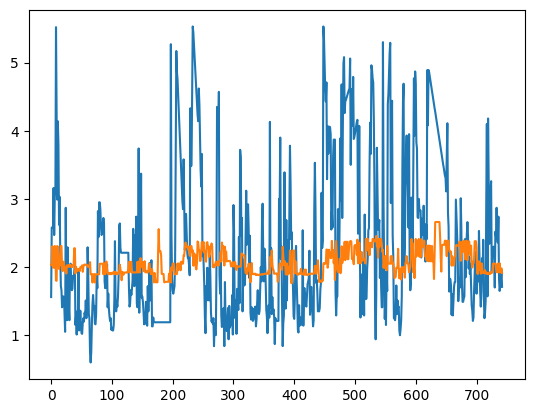

In [162]:
sns.lineplot(data = Y_test.to_list())
sns.lineplot(data = Y_test_pre)

In [3]:
df_mining_raw.shape

(737453, 24)

In [13]:
# data type preprocess
for col in df_mining_raw.columns:
    if col != 'date':
        df_mining_raw[col] = df_mining_raw[col].str.replace(',', '.', regex=False)
        df_mining_raw[col] = pd.to_numeric(df_mining_raw[col])
    else:
        df_mining_raw[col] = pd.to_datetime(df_mining_raw[col]) 

In [14]:
df_mining_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 737453 entries, 0 to 737452
Data columns (total 24 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   date                          737453 non-null  datetime64[ns]
 1   % Iron Feed                   737453 non-null  float64       
 2   % Silica Feed                 737453 non-null  float64       
 3   Starch Flow                   737453 non-null  float64       
 4   Amina Flow                    737453 non-null  float64       
 5   Ore Pulp Flow                 737453 non-null  float64       
 6   Ore Pulp pH                   737453 non-null  float64       
 7   Ore Pulp Density              737453 non-null  float64       
 8   Flotation Column 01 Air Flow  737453 non-null  float64       
 9   Flotation Column 02 Air Flow  737453 non-null  float64       
 10  Flotation Column 03 Air Flow  737453 non-null  float64       
 11  Flotation Col

In [51]:
df_mining_raw[(df_mining_raw['% Iron Feed']==55.20) & (df_mining_raw['date']=='2017-03-10 02:00:00')]

,date,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
174,2017-03-10 02:00:00,55.2,16.98,3170.41,539.673,399.697,10.1589,1.66910,249.291,248.269,...,249.774,462.601,488.724,441.674,433.629,448.477,480.866,489.382,67.06,1.11
175,2017-03-10 02:00:00,55.2,16.98,3208.30,544.922,397.529,10.1584,1.66807,250.115,252.070,...,251.598,468.357,493.623,442.700,445.156,434.102,451.634,470.266,67.06,1.11
176,2017-03-10 02:00:00,55.2,16.98,3211.33,543.488,391.626,10.1578,1.66704,249.983,250.488,...,250.269,463.978,489.004,446.021,449.784,433.768,424.245,439.254,67.06,1.11
177,2017-03-10 02:00:00,55.2,16.98,3202.64,540.863,395.229,10.1572,1.66601,249.510,248.555,...,248.412,458.823,406.195,442.004,456.188,443.211,422.532,419.389,67.06,1.11
178,2017-03-10 02:00:00,55.2,16.98,3221.00,541.626,400.020,10.1566,1.66497,249.609,250.477,...,249.840,438.478,315.514,443.460,477.986,446.378,447.038,426.756,67.06,1.11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,2017-03-10 02:00:00,55.2,16.98,3408.20,570.648,410.874,10.0889,1.70392,249.159,249.258,...,251.433,448.087,435.879,427.813,482.224,473.535,468.910,462.898,67.06,1.11
350,2017-03-10 02:00:00,55.2,16.98,3414.06,566.437,402.129,10.0883,1.70427,248.961,249.060,...,248.522,457.646,453.433,434.796,455.723,468.934,483.442,497.823,67.06,1.11
351,2017-03-10 02:00:00,55.2,16.98,3405.47,572.357,397.148,10.0878,1.70461,249.082,245.709,...,249.796,451.215,434.349,440.540,431.172,470.370,475.406,516.803,67.06,1.11
352,2017-03-10 02:00:00,55.2,16.98,3378.52,566.406,399.873,10.0872,1.70496,248.434,244.061,...,251.060,446.310,438.967,451.036,433.750,466.706,469.806,493.602,67.06,1.11


In [32]:
temp = df_mining_raw.groupby(['% Silica Concentrate', 'date']).count()[['% Iron Feed']]
temp1 = temp[temp['% Iron Feed']==1].reset_index()['date']

In [41]:
temp1.value_counts().to_frame().reset_index().sort_values('index')

,index,date
268,2017-03-12 12:00:00,180
62,2017-03-30 20:00:00,180
217,2017-04-02 08:00:00,180
228,2017-04-02 09:00:00,180
50,2017-04-03 01:00:00,180
...,...,...
277,2017-09-05 21:00:00,180
284,2017-09-05 22:00:00,180
234,2017-09-05 23:00:00,180
178,2017-09-06 00:00:00,180


In [17]:
df_mining_raw[(df_mining_raw['% Silica Concentrate']>5.52) & (df_mining_raw['% Silica Concentrate']<5.53)]

,date,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
555293,2017-07-29 20:00:00,57.46,10.80,4801.680000,637.808,405.080000,10.33970,1.71381,300.528,292.035,...,299.060,444.451,252.555,392.063000,334.993,340.588,427.846,343.693,62.360000,5.529797
555294,2017-07-29 20:00:00,57.46,10.80,4824.430000,642.565,403.687000,10.33980,1.71390,299.937,298.919,...,298.666,376.051,383.141,394.713000,394.682,370.609,452.038,368.375,62.360000,5.529593
555295,2017-07-29 20:00:00,57.46,10.80,4836.140000,624.736,401.029000,10.34040,1.71399,299.869,298.185,...,299.579,373.471,396.158,396.315000,356.765,352.086,399.213,359.175,62.360000,5.529390
555296,2017-07-29 20:00:00,57.46,10.80,4851.520000,656.820,401.131000,10.34100,1.71408,300.249,292.510,...,302.016,400.282,440.689,390.901000,314.406,339.873,353.915,371.580,62.360000,5.529187
555297,2017-07-29 20:00:00,57.46,10.80,4860.010000,571.185,405.431000,10.34160,1.71416,300.687,299.259,...,298.292,412.139,456.965,396.500000,311.203,333.652,355.066,416.219,62.360000,5.528983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645842,2017-08-19 19:00:00,44.70,30.14,827.057174,578.352,393.602000,9.68082,1.71731,300.144,294.436,...,294.331,514.082,492.946,716.204897,351.429,343.394,288.030,326.073,63.781538,5.520354
684533,2017-08-28 18:00:00,47.24,26.08,2892.770000,617.884,415.891707,9.14699,1.71407,299.384,296.015,...,292.984,517.120,492.351,554.752000,477.561,476.116,458.546,468.784,62.900000,5.527967
684534,2017-08-28 18:00:00,47.24,26.08,2977.980000,613.540,415.896117,9.14616,1.71392,299.487,292.263,...,292.326,521.979,501.687,539.594000,475.829,467.880,462.986,468.904,62.900000,5.525933
684535,2017-08-28 18:00:00,47.24,26.08,2986.720000,619.372,415.900527,9.14534,1.71377,299.487,298.265,...,294.462,512.491,505.365,523.705000,479.254,489.883,487.468,473.215,62.900000,5.523900


In [19]:
df_mining_raw2.iloc[555293:555297,:]

,date,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
555293,2017-07-29 20:00:00,"57,46","10,8","4801,68","637,808","405,08","10,3397","1,71381","300,528","292,035",...,"299,06","444,451","252,555","392,063","334,993","340,588","427,846","343,693","62,36","5,5297966728"
555294,2017-07-29 20:00:00,"57,46","10,8","4824,43","642,565","403,687","10,3398","1,7139","299,937","298,919",...,"298,666","376,051","383,141","394,713","394,682","370,609","452,038","368,375","62,36","5,5295933457"
555295,2017-07-29 20:00:00,"57,46","10,8","4836,14","624,736","401,029","10,3404","1,71399","299,869","298,185",...,"299,579","373,471","396,158","396,315","356,765","352,086","399,213","359,175","62,36","5,5293900185"
555296,2017-07-29 20:00:00,"57,46","10,8","4851,52","656,82","401,131","10,341","1,71408","300,249","292,51",...,"302,016","400,282","440,689","390,901","314,406","339,873","353,915","371,58","62,36","5,5291866913"


In [16]:
df_mining_raw.groupby(['% Iron Feed', '% Silica Feed']).count()

,,date,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,Flotation Column 04 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
% Iron Feed,% Silica Feed,,,,,,,,,,,,,,,,,,,,,
42.74,33.40,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620,...,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620
43.37,32.23,1080,1080,1080,1080,1080,1080,1080,1080,1080,1080,...,1080,1080,1080,1080,1080,1080,1080,1080,1080,1080
44.70,30.14,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620,...,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620
44.90,30.12,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620,...,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620
45.38,30.90,2700,2700,2700,2700,2700,2700,2700,2700,2700,2700,...,2700,2700,2700,2700,2700,2700,2700,2700,2700,2700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63.64,3.77,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620,...,1620,1620,1620,1620,1620,1620,1620,1620,1620,1620
64.03,6.26,142560,142560,142560,142560,142560,142560,142560,142560,142560,142560,...,142560,142560,142560,142560,142560,142560,142560,142560,142560,142560
64.46,2.77,1080,1080,1080,1080,1080,1080,1080,1080,1080,1080,...,1080,1080,1080,1080,1080,1080,1080,1080,1080,1080


In [ ]:
df_mining_raw['% Iron Feed'].